In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

sns.set_theme(
    style="whitegrid",
    font_scale=1,
    rc={
        "figure.dpi": 150,
        "savefig.dpi": 300
    }
)
tol_colors = [ "#0072B2", "#E69F00",
    "#999999",  "#56B4E9", "#009E73", "#F0E442", "#D55E00", "#CC79A7"
]

plt.rcParams.update({
    "font.size": 12,          # default font size for all text
    "axes.titlesize": 12,     # subplot titles
    "axes.labelsize": 12,     # x and y labels
    "xtick.labelsize": 12,    # tick labels
    "ytick.labelsize": 12,
    "legend.fontsize": 11,
    "figure.titlesize": 14,    # fig.suptitle()
    "xtick.bottom": True,   # show ticks on x-axis bottom
    "xtick.top": False,     # hide ticks on x-axis top
    "ytick.left": True,     # show ticks on y-axis left
    "ytick.right": False,   # hide ticks on y-axis right
    "xtick.direction": "out",
    "ytick.direction": "out"

})


sns.set_palette(tol_colors)
results_df = pd.read_csv("results/big_dataset/untargeted/cam_comparison_metrics_combined.csv")
metric_columns = [
    'mean pixel difference', 'percentage of different pixels',
    'cosine similarity', 'activation ratio', 'JS divergence',
    'important activation ratio', 'intersection over union', 'SSIM',
    'Spearman\'s rank coefficient', 'number of regions difference']
results_df

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
0,0,GradCAM,Fast Gradient Sign Method (FGSM),tench,coho,0.135725,0.539809,0.259953,0.068476,10.277822,2,1,0.911287,0.948718,0.034862,0.691205,0.550525,0.703602,0.875066,-1
1,1,GradCAM,Fast Gradient Sign Method (FGSM),tench,jellyfish,0.617867,0.450724,0.058812,0.101335,18.871572,1,1,0.907956,0.989637,0.050316,3.440874,0.738867,0.580494,0.808362,0
2,2,GradCAM,Fast Gradient Sign Method (FGSM),tench,common iguana,0.133545,0.565741,0.045563,0.109965,21.093750,1,1,0.883637,0.964103,0.051593,0.268432,0.727923,0.578382,0.832804,0
3,3,GradCAM,Fast Gradient Sign Method (FGSM),goldfish,ladybug,0.002770,0.279218,0.198230,0.115276,19.710619,1,1,0.842743,0.985322,0.083061,0.316150,0.468931,0.542671,0.642064,0
4,4,GradCAM,Fast Gradient Sign Method (FGSM),goldfish,jellyfish,0.069252,0.342394,0.240276,0.182412,38.115832,1,1,0.769738,0.989637,0.113852,0.384052,0.333777,0.442441,0.489004,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
605042,2992,ScoreCAM,Linf Add. Unif. Noise,bolete,brain coral,0.403610,0.446443,0.282497,0.153901,33.163265,1,2,0.773923,1.000000,0.089290,0.993345,0.295507,0.578285,0.804049,1
605043,2994,ScoreCAM,Linf Add. Unif. Noise,ear,banana,0.123495,0.425354,0.064818,0.053086,4.815051,2,1,0.974069,1.000000,0.014046,1.387494,0.724085,0.825992,0.932433,-1
605044,2995,ScoreCAM,Linf Add. Unif. Noise,ear,cockroach,0.771008,0.277503,0.067358,0.121452,19.874043,1,1,0.877702,1.000000,0.045187,0.681287,0.498432,0.665512,0.836672,0
605045,2997,ScoreCAM,Linf Add. Unif. Noise,toilet tissue,paper towel,0.224325,0.311979,0.066549,0.086689,7.176738,1,2,0.940359,1.000000,0.028128,2.685550,0.619332,0.753833,0.852640,1


In [2]:
## investigate image perturbation per attack method
## only keep relevant rows, images_mean_difference stays the same for all methods

filtered_df = results_df[results_df["method"] == "GradCAM"]
filtered_df

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
0,0,GradCAM,Fast Gradient Sign Method (FGSM),tench,coho,0.135725,0.539809,0.259953,0.068476,10.277822,2,1,0.911287,0.948718,0.034862,0.691205,0.550525,0.703602,0.875066,-1
1,1,GradCAM,Fast Gradient Sign Method (FGSM),tench,jellyfish,0.617867,0.450724,0.058812,0.101335,18.871572,1,1,0.907956,0.989637,0.050316,3.440874,0.738867,0.580494,0.808362,0
2,2,GradCAM,Fast Gradient Sign Method (FGSM),tench,common iguana,0.133545,0.565741,0.045563,0.109965,21.093750,1,1,0.883637,0.964103,0.051593,0.268432,0.727923,0.578382,0.832804,0
3,3,GradCAM,Fast Gradient Sign Method (FGSM),goldfish,ladybug,0.002770,0.279218,0.198230,0.115276,19.710619,1,1,0.842743,0.985322,0.083061,0.316150,0.468931,0.542671,0.642064,0
4,4,GradCAM,Fast Gradient Sign Method (FGSM),goldfish,jellyfish,0.069252,0.342394,0.240276,0.182412,38.115832,1,1,0.769738,0.989637,0.113852,0.384052,0.333777,0.442441,0.489004,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604938,2992,GradCAM,Linf Add. Unif. Noise,bolete,brain coral,0.403610,0.446443,0.282497,0.122211,21.609933,1,1,0.817547,0.898246,0.082556,0.420347,0.407828,0.568071,0.826522,0
604939,2994,GradCAM,Linf Add. Unif. Noise,ear,banana,0.123495,0.425354,0.064818,0.061289,9.526467,2,1,0.928378,1.005291,0.033876,0.766064,0.618679,0.774389,0.894700,-1
604940,2995,GradCAM,Linf Add. Unif. Noise,ear,cockroach,0.771008,0.277503,0.067358,0.044729,2.509168,2,1,0.963129,0.835052,0.040779,0.666976,0.861436,0.690937,0.751976,-1
604941,2997,GradCAM,Linf Add. Unif. Noise,toilet tissue,paper towel,0.224325,0.311977,0.066549,0.052466,3.698980,1,1,0.956193,1.026596,0.027265,1.455452,0.755906,0.721390,0.851156,0


## Success Rates per Attack

In [3]:
# Total number of unique images (as reference)
total_images = 2438

# Count number of unique image IDs per attack
attack_success = (
    filtered_df.groupby("attack")["image ID"]
    .nunique()
    .reset_index(name="successful_images")
)
attack_success

,attack,successful_images
0,Boundary Attack,2399
1,DDN Attack,2438
2,EAD Attack,2205
3,Fast Gradient Method (FGM),1659
4,Fast Gradient Sign Method (FGSM),2119
5,Gaussian Blur,2211
6,L1 Brendel Bethge,2271
7,L1 FMN,2354
8,L2 Add. Gauss. Noise,1057
9,L2 Add. Unif. Noise,1065


In [6]:
# Calculate success rate in percent
attack_success["success_rate_percent"] = (attack_success["successful_images"] / total_images * 100).round(1)
attack_success.drop(columns=["successful_images"], inplace=True)
# Rename columns for LaTeX output
attack_success.columns = ["Attack", "Success Rate (%)"]

# Sort by success rate (ascending)
attack_success = attack_success.sort_values(by="Success Rate (%)", ascending=True)

# Convert to LaTeX
latex_table = attack_success.to_latex(index=False, column_format="lrr", float_format="%.1f")

print(latex_table)

\begin{tabular}{lrr}
\toprule
Attack & Success Rate (%) \\
\midrule
L2 Add. Gauss. Noise & 43.4 \\
L2 Add. Unif. Noise & 43.7 \\
L2 Clip. Aware Add. Unif. Noise & 43.8 \\
L2 Clip. Aware Add. Gauss. Noise & 44.4 \\
L2 Rep. Add. Unif. Noise & 62.5 \\
L2 Rep. Add. Gauss. Noise & 63.2 \\
L2 Clip. Aware Rep. Add. Unif. Noise & 64.3 \\
L2 Clip. Aware Rep. Add. Gauss. Noise & 65.1 \\
Fast Gradient Method (FGM) & 68.0 \\
Virtual Adv. Attack (VAA) & 75.5 \\
Linf Add. Unif. Noise & 80.0 \\
Lin. Search Blended Unif. Noise & 80.3 \\
Salt And Pepper Noise & 85.2 \\
Fast Gradient Sign Method (FGSM) & 86.9 \\
NewtonFool & 89.4 \\
EAD Attack & 90.4 \\
Gaussian Blur & 90.7 \\
L1 Brendel Bethge & 93.2 \\
L2 Proj. Gradient Descent (PGD) & 95.1 \\
L1 FMN & 96.6 \\
L2 Basic Iterative Method (BIM) & 98.1 \\
Linf Proj. Gradient Descent (PGD) & 98.3 \\
Boundary Attack & 98.4 \\
Linf Basic Iterative Method (BIM) & 99.5 \\
L2 DeepFool & 100.0 \\
Linf Brendel Bethge & 100.0 \\
Linf DeepFool & 100.0 \\
Linf FMN &

## Image perturbation per attack

In [7]:
# Step 1: Compute IQR or range per attack
group_stats = (
    filtered_df
    .groupby("attack")["images mean difference"]
    .agg(iqr=lambda x: x.quantile(0.75) - x.quantile(0.25),
         min_val="min",
         max_val="max")
)

group_stats["range"] = group_stats["max_val"] - group_stats["min_val"]
group_stats = group_stats.sort_values("range")  # Sort attacks by distribution range
group_stats

,iqr,min_val,max_val,range
attack,,,,
L2 Brendel Bethge,0.000004,2.173220e-12,0.000055,0.000055
L1 FMN,0.000024,4.730197e-10,0.000123,0.000123
Linf Brendel Bethge,0.000012,1.945671e-11,0.000203,0.000203
DDN Attack,0.000009,3.151950e-10,0.000210,0.000210
L2 FMN,0.000015,1.840243e-06,0.000311,0.000309
EAD Attack,0.000028,6.116851e-11,0.000310,0.000310
L2 DeepFool,0.000011,3.120678e-12,0.000402,0.000402
L2 Carlini Wagner Attack,0.000022,4.887140e-12,0.000459,0.000459
Linf FMN,0.000012,1.089438e-11,0.000515,0.000515


In [54]:
attack_groups = [['L2 Brendel Bethge',
                  'L1 FMN',
                  'Linf Brendel Bethge',
                  'DDN Attack',
                  'L2 FMN',
                  'EAD Attack',
                  'L2 DeepFool',
                  'L2 Carlini Wagner Attack',
                  'Linf FMN',
                  'L2 Proj. Gradient Descent (PGD)',
                  'L2 Basic Iterative Method (BIM)',
                  'Linf Proj. Gradient Descent (PGD)',
                  'Linf DeepFool',
                  'L1 Brendel Bethge', 
                  'Linf Basic Iterative Method (BIM)',
                  'NewtonFool',
                  ],
  [

  'Virtual Adv. Attack (VAA)',
  'Fast Gradient Method (FGM)',
  'Boundary Attack',],
  [
  'Gaussian Blur',
  'L2 Add. Gauss. Noise',
  'L2 Rep. Add. Gauss. Noise',
  'L2 Add. Unif. Noise',
  'L2 Rep. Add. Unif. Noise',
  'L2 Clip. Aware Add. Unif. Noise',
  'L2 Clip. Aware Add. Gauss. Noise',
  'L2 Clip. Aware Rep. Add. Gauss. Noise',
  'L2 Clip. Aware Rep. Add. Unif. Noise',
  'Salt And Pepper Noise'],
 ['Fast Gradient Sign Method (FGSM)',
 'Lin. Search Blended Unif. Noise', 'Linf Add. Unif. Noise', 'Linf Rep. Add. Unif. Noise']]

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/4101401634.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/4101401634.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/4101401634.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/4101401634.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a Fixed

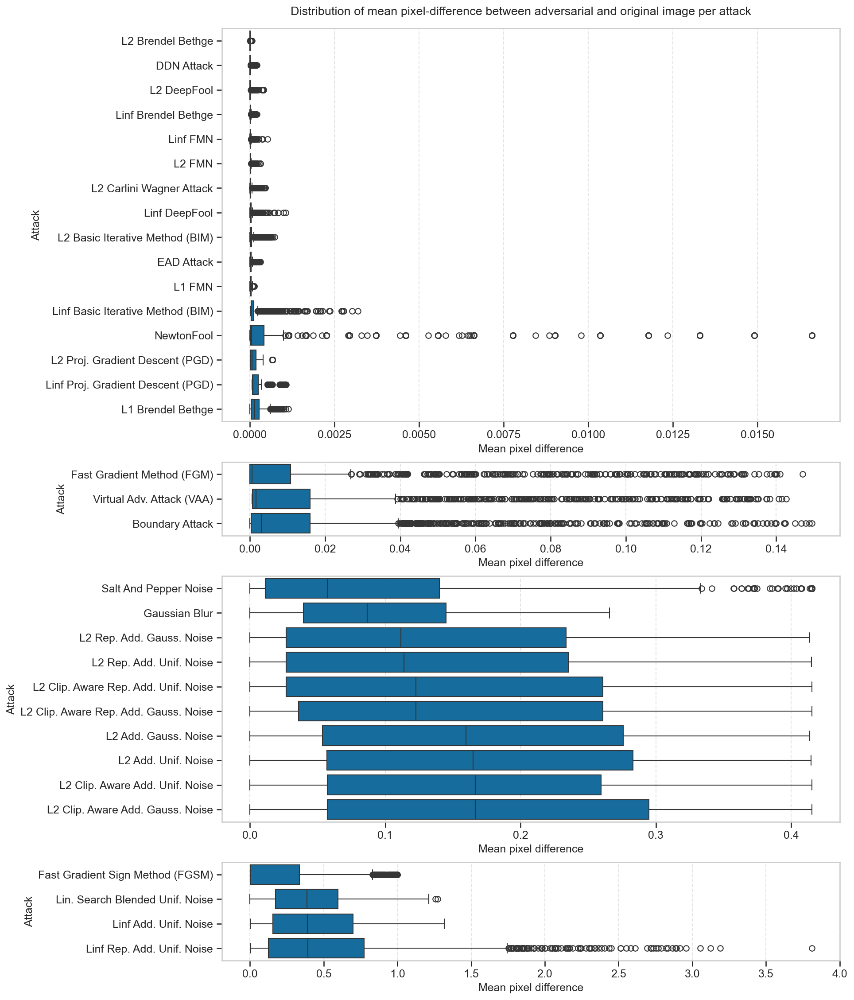

In [128]:
import matplotlib.gridspec as gridspec

# Vertical stacking - all plots under each other
n_groups = len(attack_groups)
n_cols = 1  # Single column for vertical stacking
n_rows = n_groups  # One row per group


# Calculate the number of attacks in each group to determine height ratios
group_sizes = [len(group) for group in attack_groups]
height_ratios = group_sizes  # Height proportional to number of attacks

fig = plt.figure(figsize=(12, sum(height_ratios) * 0.5))  # Adjust multiplier as needed
gs = gridspec.GridSpec(n_groups, 1, height_ratios=height_ratios, hspace=0.2, top=0.96)

fig.suptitle("Distribution of mean pixel-difference between adversarial and original image per attack", fontsize=13)
for i, group in enumerate(attack_groups):
    # Create subplot with custom height
    ax = fig.add_subplot(gs[i])
    
    # Step 1: Subset the data for the current group
    df_group = filtered_df[filtered_df["attack"].isin(group)]

    # Step 2: Compute median per attack
    attack_medians = (
        df_group
        .groupby("attack")["images mean difference"]
        .median()
        .sort_values()
    )

    # Step 3: Set order based on sorted medians
    sorted_attacks = attack_medians.index.tolist()

    # Step 4: Plot
    sns.boxplot(
        data=df_group,
        x="images mean difference",
        y="attack",
        order=sorted_attacks,
        ax=ax,
        orient="h"
    )

    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.set_xlabel("Mean pixel difference")
    ax.set_ylabel("Attack")
    ax.grid(True, axis='x', linestyle='--', alpha=0.5)


# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig(f"results/big_dataset/untargeted/attack_perturbations.svg")
plt.show()

In [42]:
attack_groups

[['L2 Brendel Bethge',
  'L1 FMN',
  'Linf Brendel Bethge',
  'DDN Attack',
  'L2 FMN',
  'EAD Attack',
  'L2 DeepFool',
  'L2 Carlini Wagner Attack',
  'Linf FMN',
  'L2 Proj. Gradient Descent (PGD)',
  'L2 Basic Iterative Method (BIM)',
  'Linf Proj. Gradient Descent (PGD)',
  'Linf DeepFool',
  'L1 Brendel Bethge',
  'Linf Basic Iterative Method (BIM)'],
 ['NewtonFool',
  'Virtual Adv. Attack (VAA)',
  'Fast Gradient Method (FGM)',
  'Boundary Attack'],
 ['Gaussian Blur',
  'L2 Add. Gauss. Noise',
  'L2 Rep. Add. Gauss. Noise',
  'L2 Add. Unif. Noise',
  'L2 Rep. Add. Unif. Noise',
  'L2 Clip. Aware Add. Unif. Noise',
  'L2 Clip. Aware Add. Gauss. Noise',
  'L2 Clip. Aware Rep. Add. Gauss. Noise',
  'L2 Clip. Aware Rep. Add. Unif. Noise',
  'Salt And Pepper Noise'],
 ['Fast Gradient Sign Method (FGSM)',
  'Lin. Search Blended Unif. Noise',
  'Linf Add. Unif. Noise',
  'Linf Rep. Add. Unif. Noise']]

In [9]:
results_df.groupby("attack")["images mean difference"].mean().reset_index(name="mean_difference").columns

Index(['attack', 'mean_difference'], dtype='object')

In [12]:
#filtered_df.loc(filtered_df["images mean difference"].idxmax())

## get row with highest value in images mean difference
highest_diff_row = filtered_df.loc[filtered_df["images mean difference"].idxmax()]
highest_diff_row

image ID                                                          2261
method                                                         GradCAM
attack                            Linf Repeated Additive Uniform Noise
true class                                                    radiator
predicted class                                                dishrag
images mean difference                                        3.810277
original score                                                0.551536
adversarial score                                             0.043481
mean pixel difference                                         0.212511
percentage of different pixels                               43.461017
number of regions original                                           1
number of regions adversarial                                        3
cosine similarity                                             0.696698
activation ratio                                                   1.0
JS div

In [13]:
filtered_df.sort_values(by="images mean difference", ascending=False)

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
339343,2261,GradCAM,Linf Repeated Additive Uniform Noise,radiator,dishrag,3.810277e+00,0.551536,0.043481,0.212511,43.461017,1,3,0.696698,1.000000,0.107666,3.877049,0.089340,0.453164,0.518437,2
336889,1909,GradCAM,Linf Repeated Additive Uniform Noise,mailbag,computer keyboard,3.188423e+00,0.269674,0.062508,0.162854,35.566805,2,1,0.755715,1.015789,0.114308,1.249739,0.333821,0.472969,0.615549,-1
323222,69,GradCAM,Linf Repeated Additive Uniform Noise,vulture,sock,3.122528e+00,0.298562,0.012174,0.078013,15.593112,1,1,0.855155,0.994624,0.075970,1.054558,0.674593,0.633535,0.757077,0
325234,333,GradCAM,Linf Repeated Additive Uniform Noise,nematode,matchstick,3.052867e+00,0.688850,0.031106,0.258676,53.573422,2,1,0.566000,0.974359,0.186539,1.463317,0.135117,0.319690,0.121710,-1
337857,2065,GradCAM,Linf Repeated Additive Uniform Noise,oscilloscope,barn spider,2.959546e+00,0.560001,0.078071,0.096775,12.902583,2,2,0.910899,1.015707,0.053805,1.197258,0.574118,0.627305,0.679801,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284781,1807,GradCAM,L2 DeepFool,horizontal bar,parallel bars,1.025388e-11,0.162996,0.162608,0.030968,1.829560,1,1,0.985695,0.921875,0.011852,1.045570,0.794688,0.854907,0.946643,0
204573,1807,GradCAM,L2 Brendel Bethge,horizontal bar,parallel bars,8.311940e-12,0.162996,0.162577,0.030966,1.829560,1,1,0.985697,0.921875,0.011851,1.046132,0.794688,0.854910,0.946653,0
568563,386,GradCAM,L2 Carlini Wagner Attack,black stork,European gallinule,4.887140e-12,0.112238,0.111811,0.056255,4.709423,1,1,0.972301,0.879310,0.026596,0.445940,0.833379,0.680439,0.876212,0
274286,386,GradCAM,L2 DeepFool,black stork,European gallinule,3.120678e-12,0.112238,0.111867,0.056254,4.707430,1,1,0.972301,0.879310,0.026595,0.445940,0.833547,0.680436,0.876215,0


## Metric Distributions

In [131]:
def make_scatter_plot(dataframe, col1, col2):
    title=f"Scatterplot of {col1} against {col2}"

    if col1 not in dataframe.columns or col2 not in dataframe.columns:
        raise ValueError(f"Spalten {col1} und/oder {col2} nicht im DataFrame vorhanden.")

    x = dataframe[col1]
    y = dataframe[col2]

    plt.figure(figsize=(6, 5))
    plt.scatter(x, y, alpha=0.7, edgecolors='k')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(title if title else f"{col1} vs {col2}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

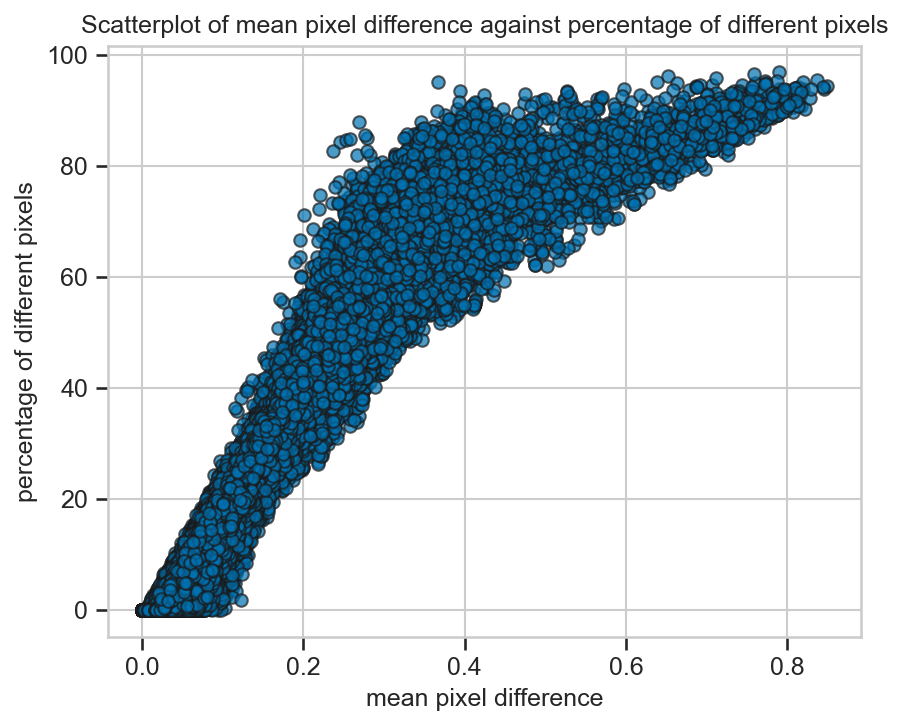

In [132]:
make_scatter_plot(results_df, "mean pixel difference", "percentage of different pixels")

In [43]:
def make_scatter_plot(dataframe, col1, col2, color_by='method'):
    title = f"Scatterplot of {col1} against {col2}"

    # Check required columns
    for col in [col1, col2, color_by]:
        if col not in dataframe.columns:
            raise ValueError(f"Spalte '{col}' nicht im DataFrame vorhanden.")

    x = dataframe[col1]
    y = dataframe[col2]
    categories = dataframe[color_by]

    # Map each category to a unique colour
    unique_categories = categories.unique()
    palette = sns.color_palette('tab10', len(unique_categories))
    color_map = dict(zip(unique_categories, palette))
    colors = categories.map(color_map)

    plt.figure(figsize=(6, 5))
    scatter = plt.scatter(x, y, c=colors, alpha=0.7, edgecolors='k')

    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(title)
    plt.grid(True)
    plt.tight_layout()

    # Legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=cat,
                          markerfacecolor=color_map[cat], markersize=8, markeredgecolor='k')
               for cat in unique_categories]
    plt.legend(handles=handles, title=color_by, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()

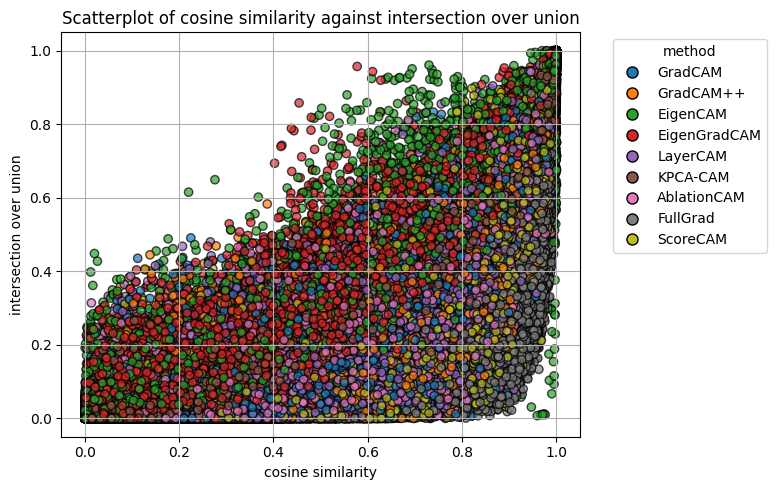

In [46]:
make_scatter_plot(results_df, "cosine similarity", "intersection over union")

In [23]:
results_df.groupby("method")["activation ratio"].mean()

method
AblationCAM        0.987184
EigenCAM           1.001275
EigenGradCAM       1.015840
FullGrad           1.000000
GradCAM            0.987861
GradCAMPlusPlus    1.000211
KPCA_CAM           1.005739
LayerCAM           1.000247
ScoreCAM           1.000295
Name: activation ratio, dtype: float64

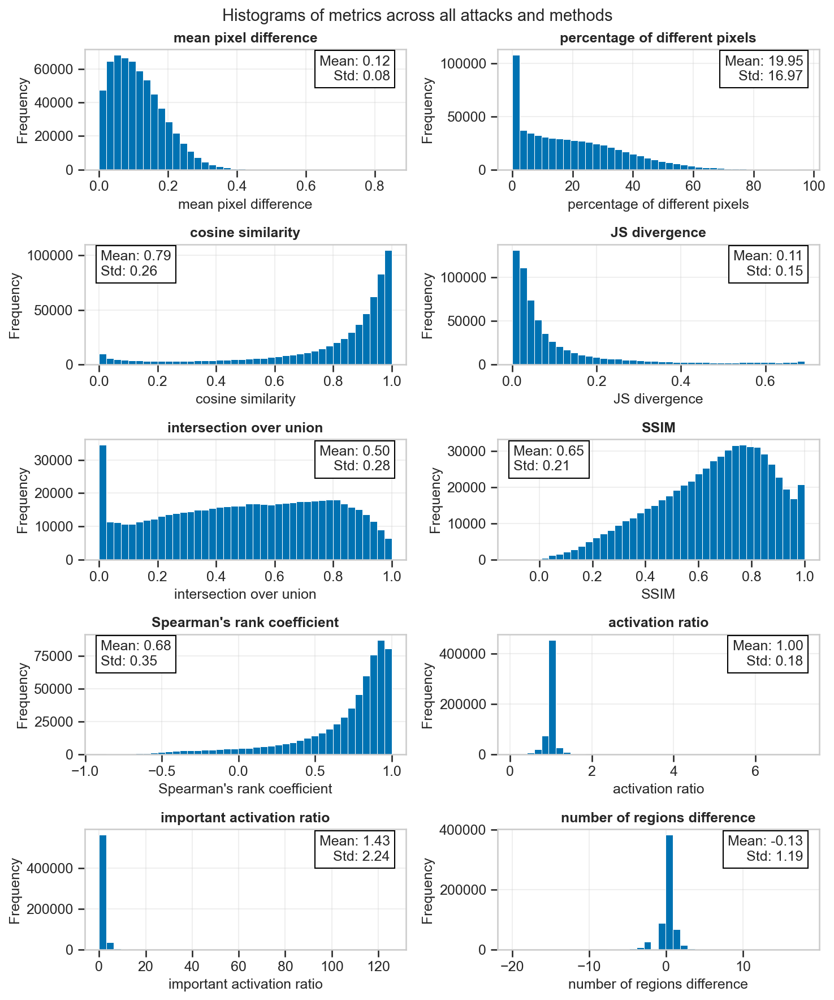

In [3]:
## create histograms across all attacks and methods for each metric as one plot with multiple subplots

# Reorder metric_columns to put the specified metrics at the end
metric_columns_reordered = [
    'mean pixel difference', 
    'percentage of different pixels', 
    'cosine similarity',
    'JS divergence', 
    'intersection over union', 
    'SSIM', 
    'Spearman\'s rank coefficient',
    'activation ratio',
    'important activation ratio', 
    'number of regions difference'
]

# Create figure with subplots (2 columns, 5 rows)
fig, axes = plt.subplots(5, 2, figsize=(10, 12))
fig.suptitle('Histograms of metrics across all attacks and methods')

# Flatten axes array for easier indexing
axes_flat = axes.flatten()

# Create histogram for each metric
for i, metric in enumerate(metric_columns_reordered):
    ax = axes_flat[i]
    
    # Create histogram
    ax.hist(results_df[metric], bins=40, linewidth=0.5)
    
    # Set title and labels
    ax.set_title(f'{metric}', fontweight='bold')
    ax.set_xlabel(metric)
    ax.set_ylabel('Frequency')
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3)
    
    # Add basic statistics as text
    mean_val = results_df[metric].mean()
    std_val = results_df[metric].std()
    
    # Position the text box based on the metric
    if metric in ['SSIM', 'Spearman\'s rank coefficient', 'cosine similarity']:
        x_pos = 0.05  # Upper left for SSIM and Spearman's rank coefficient
        h_align = 'left'
    else:
        x_pos = 0.95  # Top right for all other metrics
        h_align = 'right'
    
    ax.text(x_pos, 0.95, f'Mean: {mean_val:.2f}\nStd: {std_val:.2f}', 
            transform=ax.transAxes, verticalalignment='top', horizontalalignment=h_align,
            bbox=dict(facecolor='white', edgecolor='black', linewidth=1))


# Adjust layout to prevent overlap
plt.tight_layout()
plt.subplots_adjust(top=0.94)  # Make room for the main title

plt.savefig("latex/img/results/eda_metric_distributions.svg", format="svg", bbox_inches='tight')
# Show the plot
plt.show()

In [24]:
results_df.describe()

,image ID,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
count,605047.000000,6.050470e+05,605047.000000,605047.000000,605047.000000,605047.000000,605047.000000,605047.000000,605047.000000,605047.000000,6.050470e+05,605047.000000,605047.000000,605047.000000,605047.000000,605047.000000
mean,1461.813879,8.137652e-02,0.430926,0.165753,0.115494,19.952752,1.529680,1.397513,0.786464,0.999850,1.086723e-01,1.430338,0.497857,0.654705,0.678203,-0.132167
std,870.161469,2.011844e-01,0.168157,0.130229,0.079753,16.972325,1.142196,0.937526,0.257170,0.180602,1.471919e-01,2.239196,0.281184,0.213224,0.348207,1.194843
min,0.000000,2.173220e-12,0.028309,0.001514,0.000007,0.000000,1.000000,1.000000,0.000000,0.055556,2.842819e-09,0.016952,0.000000,-0.101893,-0.908324,-20.000000
25%,699.000000,7.528597e-06,0.312821,0.082431,0.054531,5.245536,1.000000,1.000000,0.719437,0.987013,2.004296e-02,0.631555,0.269289,0.511571,0.575736,0.000000
50%,1421.000000,8.846223e-05,0.428599,0.148628,0.102777,17.012117,1.000000,1.000000,0.896321,1.000000,4.842745e-02,1.000000,0.515060,0.686960,0.810169,0.000000
75%,2217.000000,5.573787e-02,0.531058,0.217789,0.161419,30.965003,2.000000,2.000000,0.961858,1.004808,1.247785e-01,1.572908,0.737061,0.820982,0.913990,0.000000
max,2999.000000,3.810277e+00,0.986934,1.000000,0.849023,96.920839,21.000000,21.000000,1.000001,7.200000,6.931473e-01,125.740947,1.000000,1.000000,1.000000,18.000000


In [ ]:
# detect outliers in activation ratio
results_df["activation ratio"].describe()

count    605047.000000
mean          0.999850
std           0.180602
min           0.055556
25%           0.987013
50%           1.000000
75%           1.004808
max           7.200000
Name: activation ratio, dtype: float64

In [36]:
threshold = results_df["activation ratio"].quantile(0.95)
print(threshold)
outliers = results_df[results_df["activation ratio"] > threshold]
outliers["method"].value_counts() 

1.1987577639751552


method
EigenGradCAM    12674
EigenCAM         7933
KPCA_CAM         6946
AblationCAM      1754
GradCAM           944
Name: count, dtype: int64

In [34]:
outliers["attack"].value_counts() / results_df["attack"].value_counts()

attack
Boundary Attack                                       0.037377
DDN Attack                                            0.052456
EAD Attack                                            0.035878
Fast Gradient Method (FGM)                            0.050499
Fast Gradient Sign Method (FGSM)                      0.050128
GaussianBlur                                          0.063873
L1 Brendel Bethge                                     0.032098
L1 FMN                                                0.042198
L2 Additive Gaussian Noise                            0.047409
L2 Additive Uniform Noise                             0.044757
L2 Basic Iterative Method (BIM)                       0.057925
L2 Brendel Bethge                                     0.045347
L2 Carlini Wagner Attack                              0.038465
L2 Clipping Aware Additive Gaussian Noise             0.049086
L2 Clipping Aware Additive Uniform Noise              0.048377
L2 Clipping Aware Repeated Additive Gaussian Noi

In [39]:
# check outliers in important activation ratio
threshold = results_df["important activation ratio"].quantile(0.95)
print(threshold)
outliers = results_df[results_df["important activation ratio"] > threshold]
outliers["method"].value_counts()

3.767857142857143


method
EigenGradCAM       4543
FullGrad           4163
ScoreCAM           3810
AblationCAM        3624
LayerCAM           3562
GradCAMPlusPlus    3433
GradCAM            3188
EigenCAM           2712
KPCA_CAM           1216
Name: count, dtype: int64

In [4]:
## plot distribution as violinplot
def plot_metric_distribution_per_method(dataframe, metric, violinplot=False):
    plt.figure(figsize=(8, 6))
    # sort methods by their mean value for the metric without modifying the original dataframe

    sorted_methods = dataframe.groupby('method')[metric].median().sort_values().index.tolist()
    dataframe['method_ordered'] = pd.Categorical(dataframe['method'], categories=sorted_methods, ordered=True)

    # change color of inner boxplot to dark blue
    if violinplot:
        sns.violinplot(data=dataframe, x='method_ordered', y=metric, width=1, inner="quart")
    else:
        sns.boxplot(data=dataframe, x='method_ordered', y=metric)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Method')
    plt.ylabel(metric.capitalize())
    plt.title(f'Distribution of {metric} per method')
    plt.grid(True)
    plt.tight_layout()
    if violinplot:
        plt.savefig(f'results/big_dataset/untargeted/{metric.replace(" ", "_")}_distribution_violinplot_per_method.svg', format="svg", bbox_inches='tight')
    else:
        plt.savefig(f'results/big_dataset/untargeted/{metric.replace(" ", "_")}_distribution_per_method.svg', format="svg", bbox_inches='tight')
    dataframe.drop(columns=['method_ordered'], inplace=True)  # Clean up the temporary column
    plt.show()

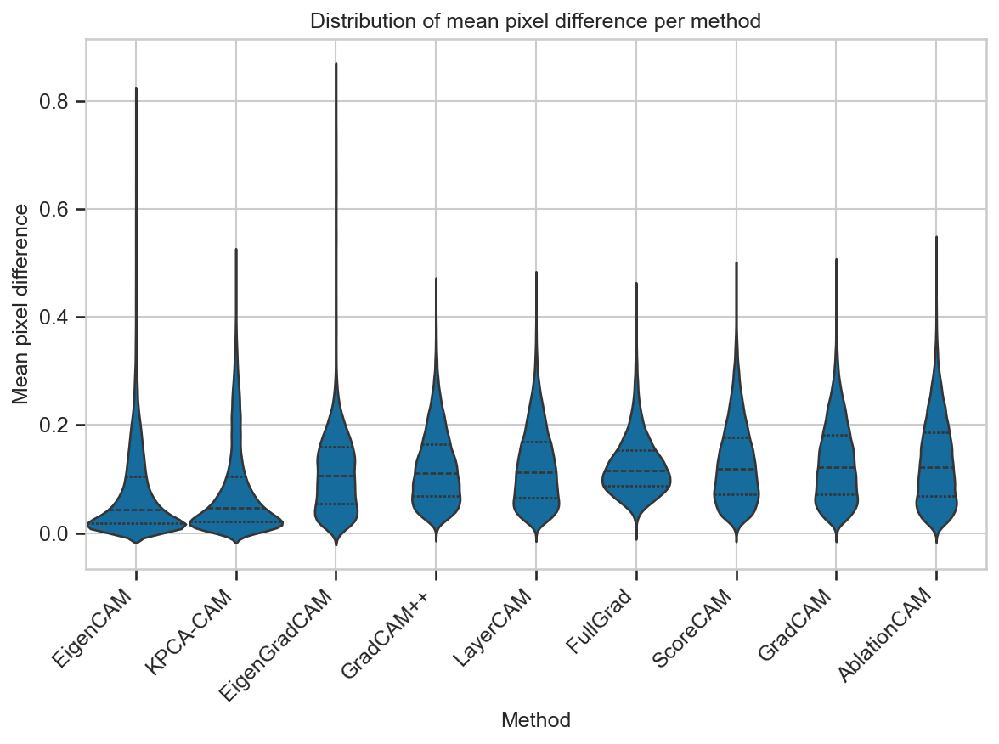

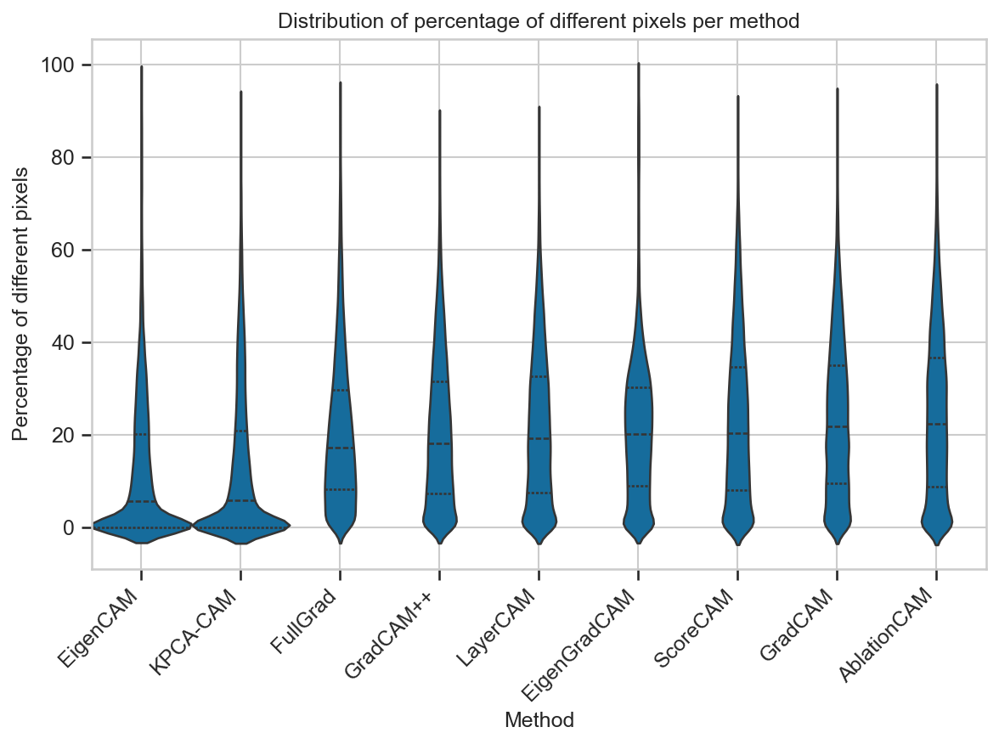

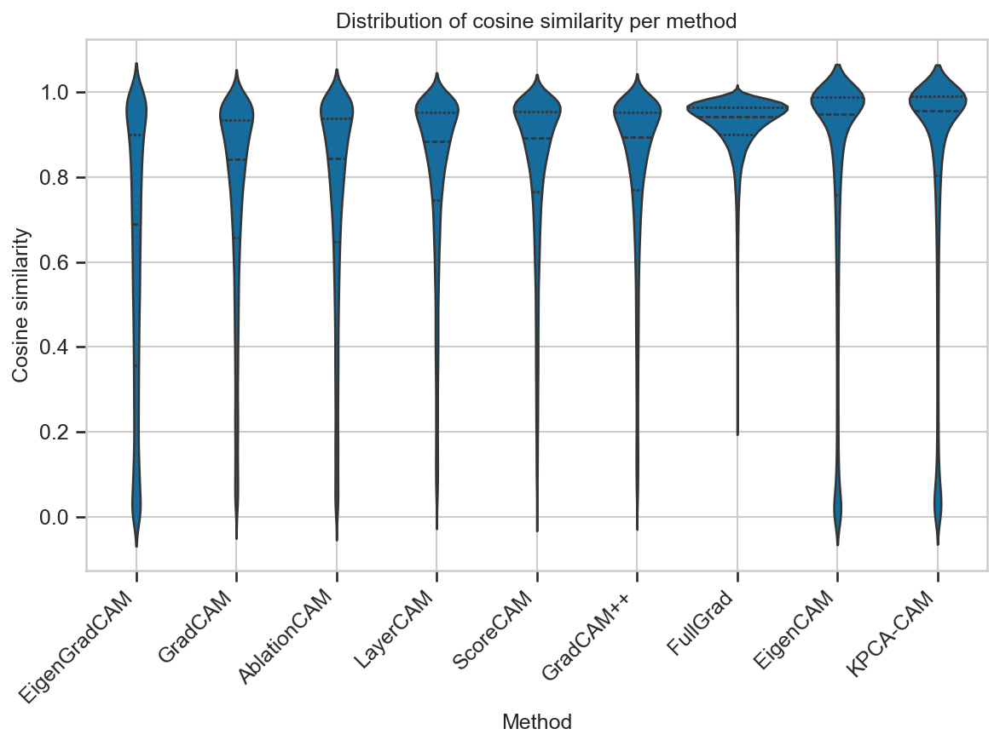

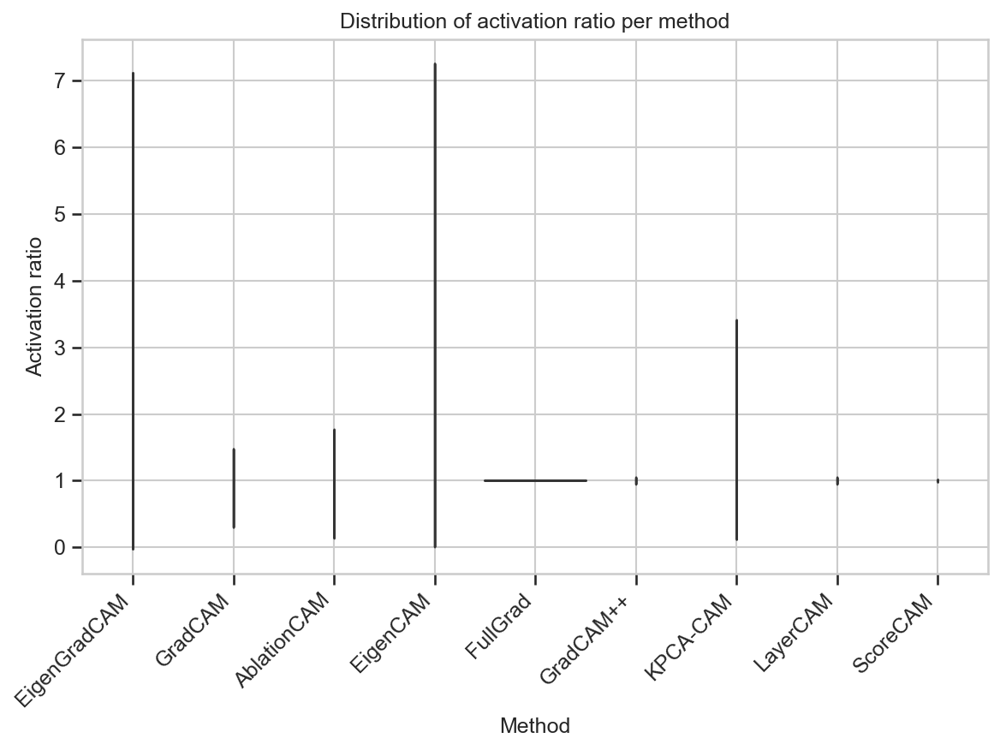

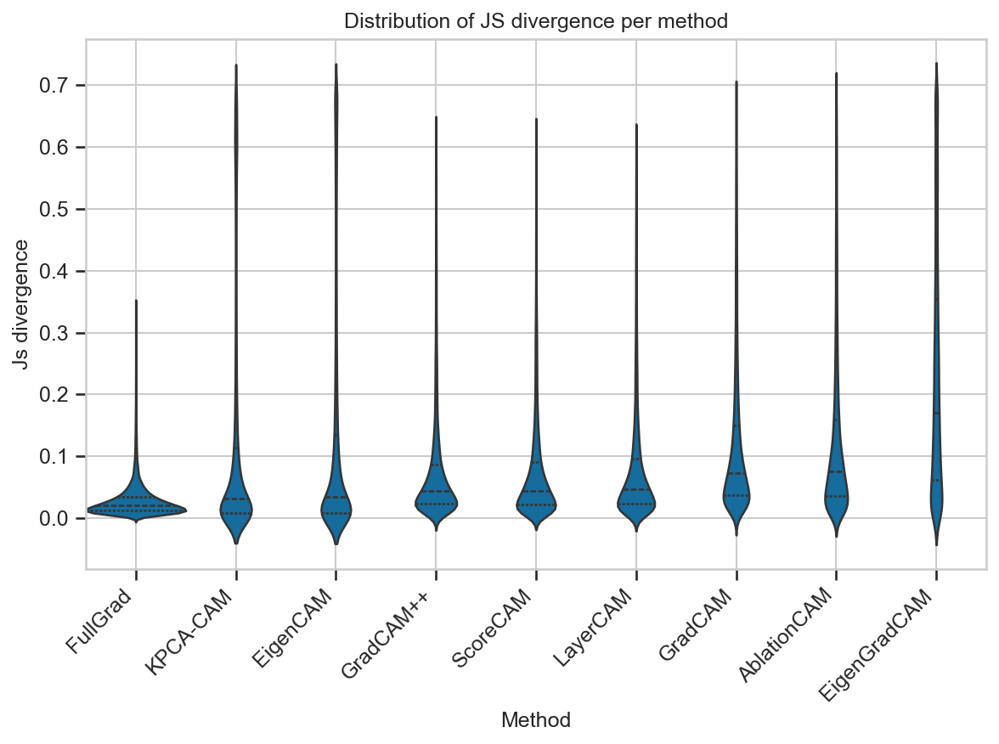

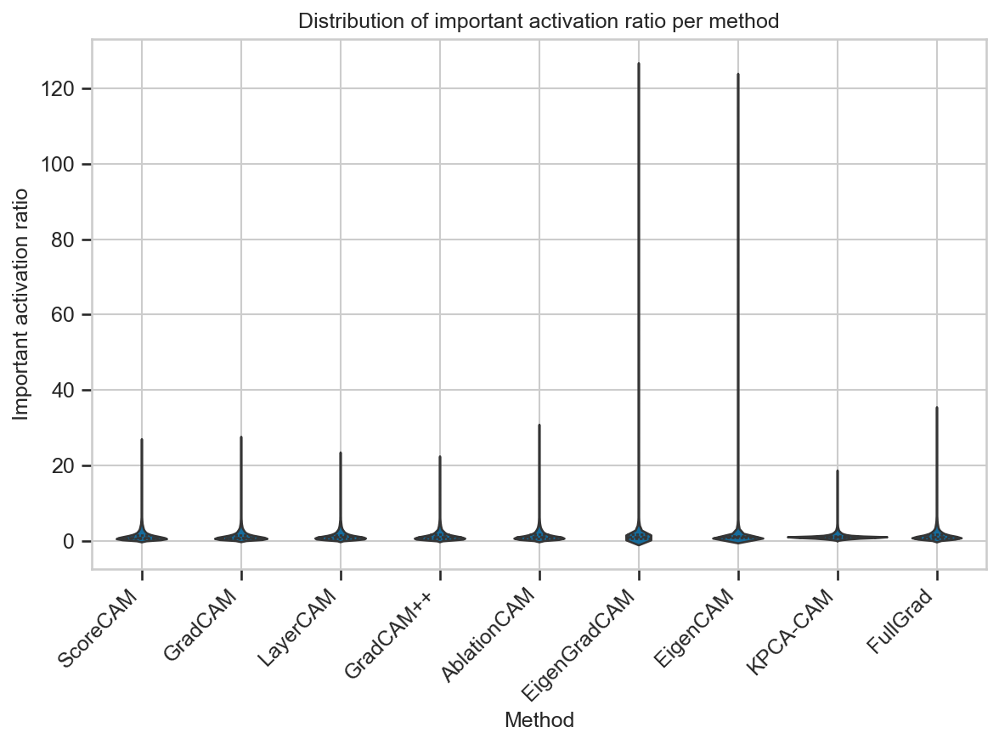

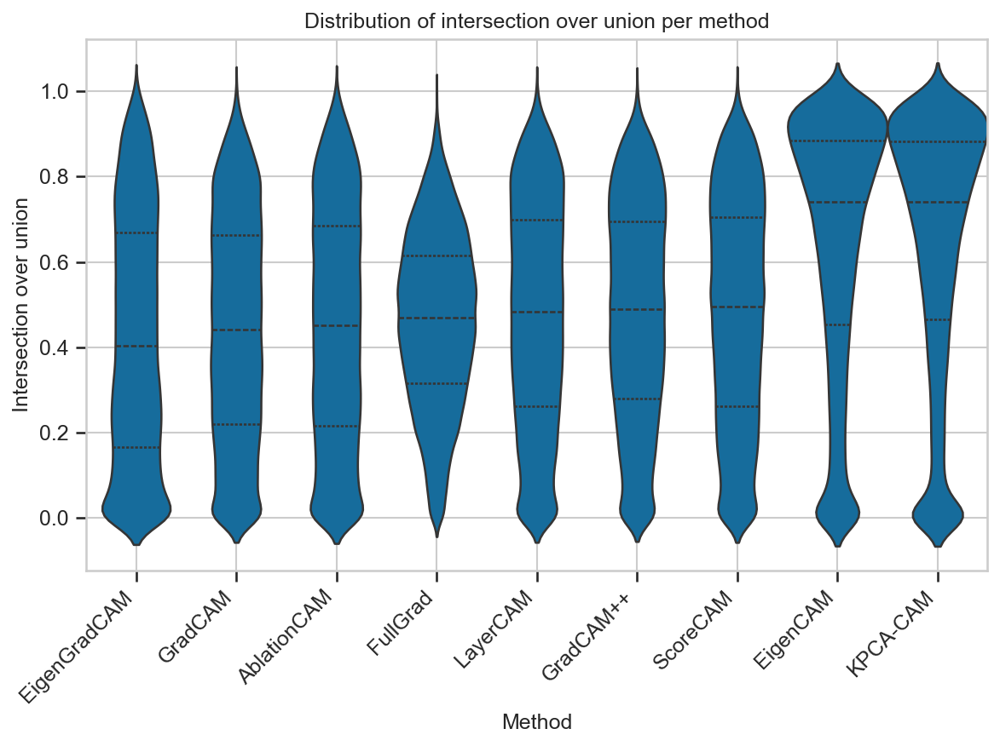

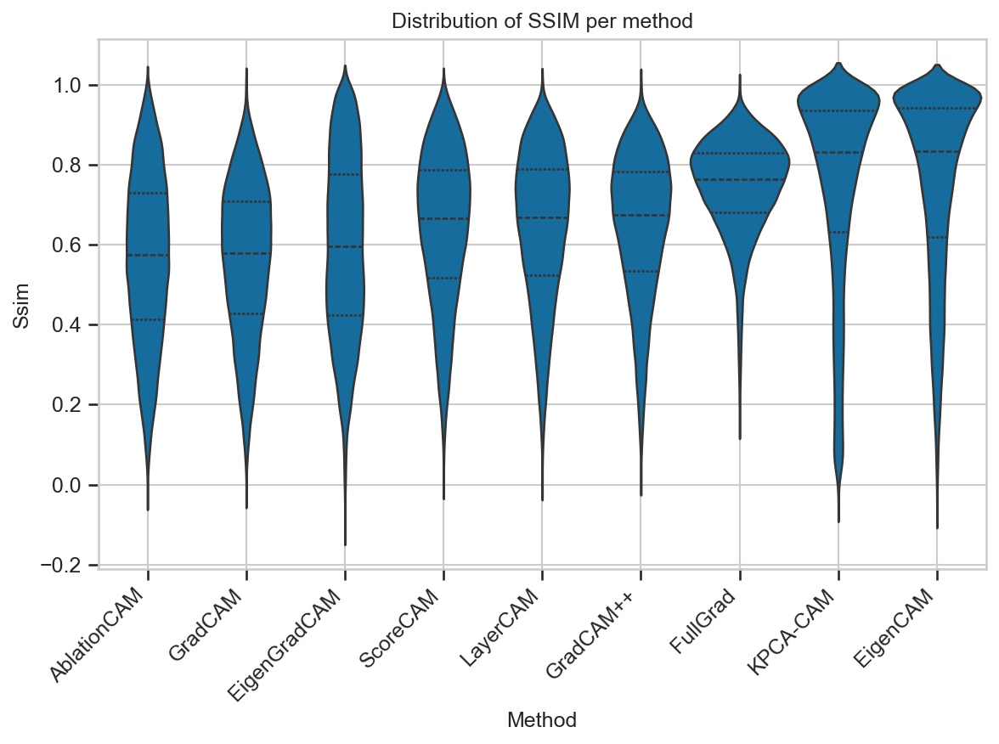

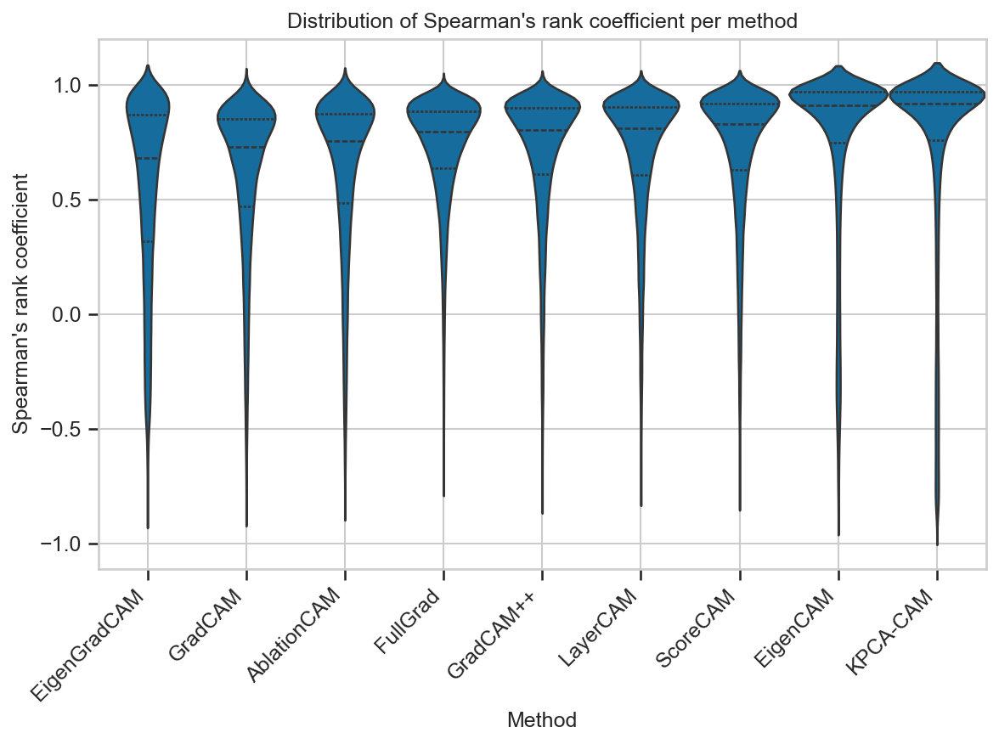

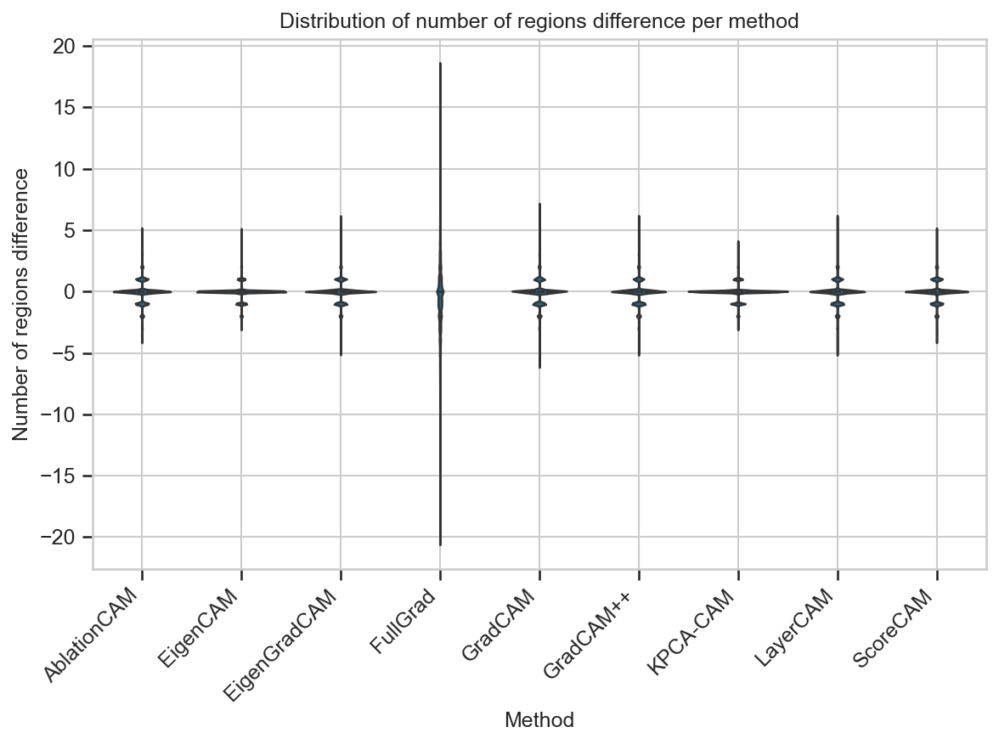

In [5]:
for col in metric_columns:
    plot_metric_distribution_per_method(results_df, col, violinplot=True)

In [60]:
results_df.groupby("method")["number of regions difference"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,67227.0,-0.052747,0.810477,-4.0,0.0,0.0,0.0,5.0
EigenCAM,67227.0,-0.059069,0.542958,-3.0,0.0,0.0,0.0,5.0
EigenGradCAM,67227.0,-0.046023,0.722348,-5.0,0.0,0.0,0.0,6.0
FullGrad,67229.0,-0.613188,2.844725,-20.0,-2.0,0.0,1.0,18.0
GradCAM,67227.0,-0.094887,0.825235,-6.0,0.0,0.0,0.0,7.0
GradCAMPlusPlus,67227.0,-0.118182,0.847470,-5.0,0.0,0.0,0.0,6.0
KPCA_CAM,67227.0,-0.057477,0.548104,-3.0,0.0,0.0,0.0,4.0
LayerCAM,67227.0,-0.098219,0.843726,-5.0,0.0,0.0,0.0,6.0
ScoreCAM,67229.0,-0.049696,0.778353,-4.0,0.0,0.0,0.0,5.0


In [67]:
results_df.groupby("attack")["number of regions difference"].describe()

,count,mean,std,min,25%,50%,75%,max
attack,,,,,,,,
Boundary Attack,21591.0,-0.180816,1.182356,-19.0,0.0,0.0,0.0,12.0
DDN Attack,21942.0,-0.184441,1.201433,-20.0,0.0,0.0,0.0,12.0
EAD Attack,19845.0,-0.129907,1.160543,-18.0,0.0,0.0,0.0,15.0
Fast Gradient Method (FGM),14931.0,-0.081776,1.174271,-15.0,0.0,0.0,0.0,10.0
Fast Gradient Sign Method (FGSM),19071.0,-0.162708,1.209951,-15.0,0.0,0.0,0.0,13.0
GaussianBlur,19899.0,-0.115634,1.238779,-19.0,0.0,0.0,0.0,11.0
L1 Brendel Bethge,20749.0,-0.154610,1.136653,-20.0,0.0,0.0,0.0,16.0
L1 FMN,21186.0,-0.140470,1.169754,-18.0,0.0,0.0,0.0,13.0
L2 Additive Gaussian Noise,9513.0,-0.144224,1.117005,-14.0,0.0,0.0,0.0,9.0


In [6]:
results_df.groupby("method")["important activation ratio"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,67227.0,1.399170,1.481679,0.039956,0.592019,0.986933,1.642681,30.568966
EigenCAM,67227.0,1.418532,2.654988,0.018030,0.732530,1.005621,1.392857,123.413919
EigenGradCAM,67227.0,1.913846,4.968183,0.016952,0.607156,0.996374,1.697287,125.740947
FullGrad,67229.0,1.510436,1.595288,0.038188,0.672918,1.073446,1.764362,35.205556
GradCAM,67227.0,1.319943,1.331093,0.047915,0.557081,0.946809,1.576350,27.401802
GradCAMPlusPlus,67227.0,1.362876,1.368811,0.036992,0.577582,0.984395,1.626602,22.189427
KPCA_CAM,67227.0,1.217491,0.809008,0.080385,0.835516,1.023164,1.321121,18.572973
LayerCAM,67227.0,1.368190,1.372732,0.039575,0.584362,0.979432,1.619689,23.234177
ScoreCAM,67229.0,1.362557,1.469181,0.027856,0.531425,0.942822,1.618415,26.753125


## Groups:

In [10]:
results_df.groupby("method")["cosine similarity"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,67227.0,0.750185,0.253184,0.000042,0.648387,0.843841,0.939663,1.000000
EigenCAM,67227.0,0.795832,0.304419,0.000000,0.757412,0.948839,0.989442,1.000001
EigenGradCAM,67227.0,0.611135,0.320611,0.000000,0.356737,0.690794,0.901554,1.000000
FullGrad,67229.0,0.917769,0.081593,0.211155,0.901486,0.942358,0.965647,0.999997
GradCAM,67227.0,0.751522,0.246191,0.002252,0.656942,0.843307,0.933805,1.000000
GradCAMPlusPlus,67227.0,0.817446,0.202710,0.013994,0.769903,0.893750,0.952066,1.000001
KPCA_CAM,67227.0,0.809752,0.299585,0.000000,0.803460,0.956122,0.990146,1.000001
LayerCAM,67227.0,0.804558,0.213809,0.017996,0.746836,0.885179,0.951963,1.000001
ScoreCAM,67229.0,0.819975,0.195673,0.008980,0.765359,0.893222,0.954658,1.000000


In [7]:
## describe the distribution of number of regions adversarial for each method
results_df.groupby("method")["number of regions adversarial"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,67227.0,1.315543,0.605455,1.0,1.0,1.0,2.0,6.0
EigenCAM,67227.0,1.142934,0.400472,1.0,1.0,1.0,1.0,6.0
EigenGradCAM,67227.0,1.237628,0.526043,1.0,1.0,1.0,1.0,7.0
FullGrad,67229.0,2.553779,2.010137,1.0,1.0,2.0,3.0,21.0
GradCAM,67227.0,1.286180,0.580389,1.0,1.0,1.0,1.0,8.0
GradCAMPlusPlus,67227.0,1.290226,0.579558,1.0,1.0,1.0,1.0,8.0
KPCA_CAM,67227.0,1.178634,0.433509,1.0,1.0,1.0,1.0,6.0
LayerCAM,67227.0,1.298615,0.593882,1.0,1.0,1.0,1.0,7.0
ScoreCAM,67229.0,1.274048,0.567444,1.0,1.0,1.0,1.0,6.0


In [9]:
results_df.columns

Index(['image ID', 'method', 'attack', 'true class', 'predicted class',
       'images mean difference', 'original score', 'adversarial score',
       'mean pixel difference', 'percentage of different pixels',
       'number of regions original', 'number of regions adversarial',
       'cosine similarity', 'activation ratio', 'JS divergence',
       'important activation ratio', 'intersection over union', 'SSIM',
       'Spearman's rank coefficient', 'number of regions difference'],
      dtype='object')

## find maximum disturbed image

In [ ]:
# find 10 most disturbed image
max_disturbed_rows = results_df.nlargest(50, "images mean difference")
max_disturbed_rows

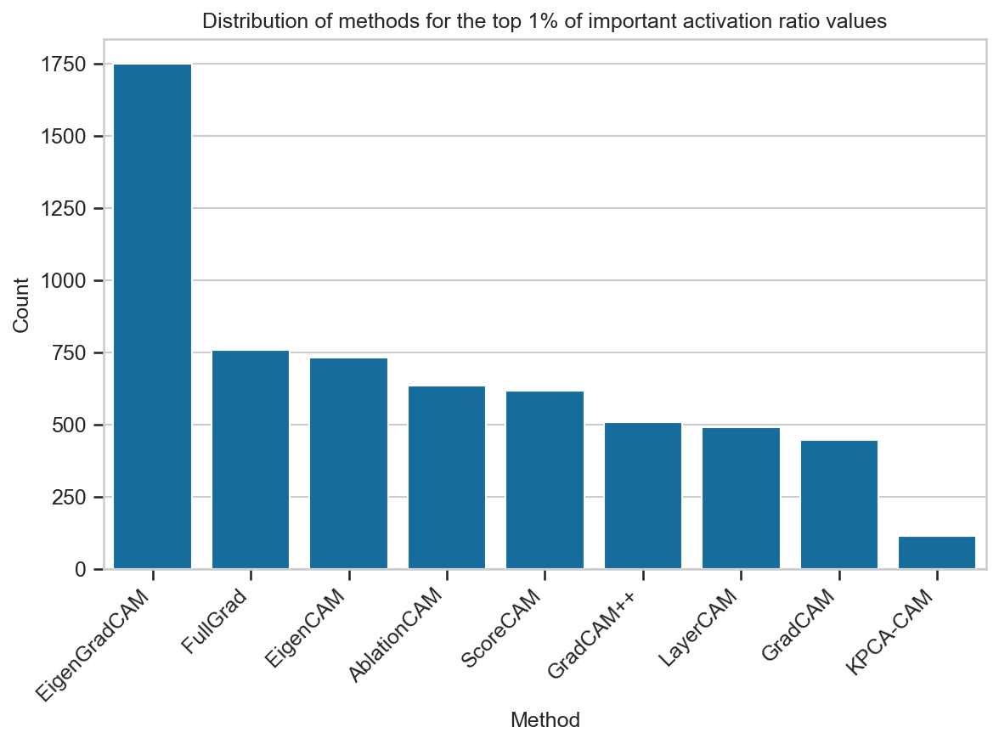

In [135]:
# check distribution of methods for the outlier percentile (5%) of important activation ratio
outlier_threshold = results_df["important activation ratio"].quantile(0.99)
outlier_data = results_df[results_df["important activation ratio"] > outlier_threshold]

plt.figure(figsize=(8, 6))
sns.countplot(data=outlier_data, x="method", order=outlier_data["method"].value_counts().index)
plt.title("Distribution of methods for the top 1% of important activation ratio values")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Method")
plt.ylabel("Count")
plt.tight_layout()
plt.savefig("latex/img/plots_appendix/important_activation_ratio_outliers.svg")
plt.show()

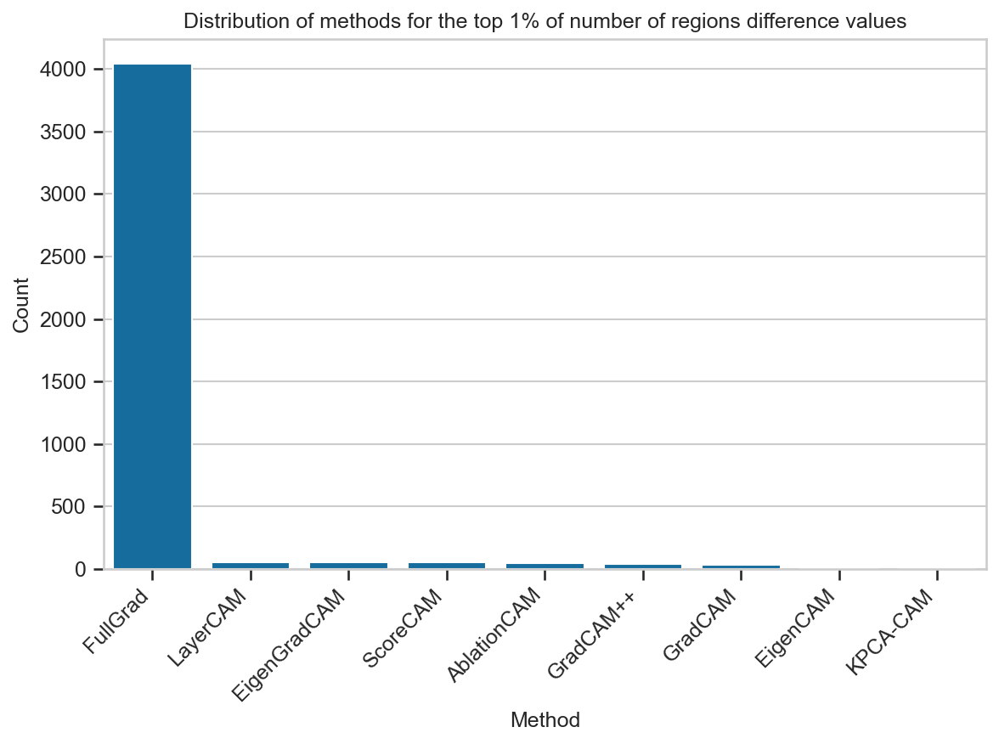

In [136]:
# check distribution of methods for the outlier percentile (1%) of number of regions difference
outlier_threshold = results_df["number of regions difference"].quantile(0.99)
outlier_data = results_df[results_df["number of regions difference"] > outlier_threshold]

plt.figure(figsize=(8, 6))
sns.countplot(data=outlier_data, x="method", order=outlier_data["method"].value_counts().index)
plt.title("Distribution of methods for the top 1% of number of regions difference values")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Method")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [78]:
results_df.sort_values(by="cosine similarity", ascending=False).head(20)

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
123199,386,GradCAM++,L1 FMN,black stork,black stork,4.730197e-10,0.112237,0.111776,0.000030,0.0,1,1,1.000001,1.0,8.817112e-09,1.000000,0.999801,1.000000,1.000000,0
383585,386,GradCAM++,Boundary Attack,black stork,European gallinule,3.367570e-10,0.112238,0.111813,0.000022,0.0,1,1,1.000001,1.0,7.396450e-09,1.000000,0.999801,1.000000,1.000000,0
160608,2610,EigenCAM,Linf Brendel Bethge,tricycle,jinrikisha,2.819111e-10,0.248514,0.246921,0.000034,0.0,1,1,1.000001,1.0,5.161438e-08,1.002033,0.999103,1.000000,1.000000,0
419235,386,GradCAM++,L1 Brendel Bethge,black stork,black stork,4.771116e-10,0.112237,0.111768,0.000033,0.0,1,1,1.000001,1.0,1.042767e-08,1.000000,0.999601,1.000000,1.000000,0
204627,1807,EigenCAM,L2 Brendel Bethge,horizontal bar,parallel bars,8.311940e-12,0.162996,0.162577,0.000028,0.0,1,1,1.000001,1.0,1.716418e-08,1.001014,0.999801,1.000000,1.000000,0
284835,1807,EigenCAM,L2 DeepFool,horizontal bar,parallel bars,1.025388e-11,0.162996,0.162608,0.000030,0.0,1,1,1.000001,1.0,2.048075e-08,1.001014,0.999801,1.000000,1.000000,0
95590,2610,LayerCAM,Linf FMN,tricycle,jinrikisha,2.120331e-10,0.248514,0.246904,0.000055,0.0,1,1,1.000001,1.0,4.843886e-08,1.000000,0.999701,0.999999,0.999999,0
584647,2610,EigenCAM,L2 Carlini Wagner Attack,tricycle,jinrikisha,1.644510e-10,0.248514,0.247151,0.000039,0.0,1,1,1.000001,1.0,5.668434e-08,1.003049,0.999103,1.000000,1.000000,0
90084,1807,KPCA-CAM,Linf FMN,horizontal bar,parallel bars,2.302816e-11,0.162996,0.162555,0.000024,0.0,1,1,1.000001,1.0,6.031419e-08,1.000000,1.000000,0.999999,1.000000,0
290361,2610,EigenCAM,L2 DeepFool,tricycle,jinrikisha,5.919790e-11,0.248514,0.246924,0.000039,0.0,1,1,1.000000,1.0,4.466461e-08,1.003049,0.999801,1.000000,1.000000,0


# metric distributions per attack

In [141]:
import textwrap

def plot_metric_distribution_per_attack(dataframe, metric, violinplot=False, wrap_width=40, fontsize=11):
    # Sort attacks by their median value for the metric
    sorted_attacks = dataframe.groupby('attack')[metric].median().sort_values().index.tolist()
    dataframe['attack_ordered'] = pd.Categorical(dataframe['attack'], categories=sorted_attacks, ordered=True)

    plt.figure(figsize=(10, max(12, 0.3 * len(sorted_attacks))))  # auto height scaling
    if violinplot:
        sns.violinplot(
            data=dataframe, 
            y='attack_ordered', x=metric, 
            scale='width', inner="quart"
        )
    else:
        sns.boxplot(
            data=dataframe, 
            y='attack_ordered', x=metric
        )

    # Wrap long y-tick labels
    labels = [textwrap.fill(label, wrap_width) for label in sorted_attacks]
    plt.yticks(ticks=range(len(sorted_attacks)), labels=labels, fontsize=fontsize)

    plt.xlabel(metric.capitalize(), fontsize=fontsize)
    plt.ylabel("Attack", fontsize=fontsize)
    plt.title(f'Distribution of {metric} per attack', fontsize=fontsize+2)
    plt.grid(True, axis="x")
    plt.tight_layout()

    # Save
    suffix = "violinplot" if violinplot else "boxplot"
    plt.savefig(
        f'latex/img/plots_appendix/{metric.replace(" ", "_")}_distribution_{suffix}_per_attack.svg',
        format="svg", bbox_inches='tight'
    )

    dataframe.drop(columns=['attack_ordered'], inplace=True)
    plt.show()

In [138]:
# filter dataframe such that every attack has the same number of samples (common image IDs)
# Get all unique attacks
all_attacks = results_df['attack'].unique()

# For each attack, find the set of image IDs that have results
image_sets_per_attack = [
    set(results_df[results_df['attack'] == attack]['image ID'].unique())
    for attack in all_attacks
]

# Intersection: images common to all attacks
common_image_ids = set.intersection(*image_sets_per_attack)
print(f"Number of images with successful adversarial examples for all attacks: {len(common_image_ids)}")

Number of images with successful adversarial examples for all attacks: 783


In [139]:
attack_df = results_df[results_df['image ID'].isin(common_image_ids)].copy()

In [77]:
attack_df["image ID"].unique().size

783

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


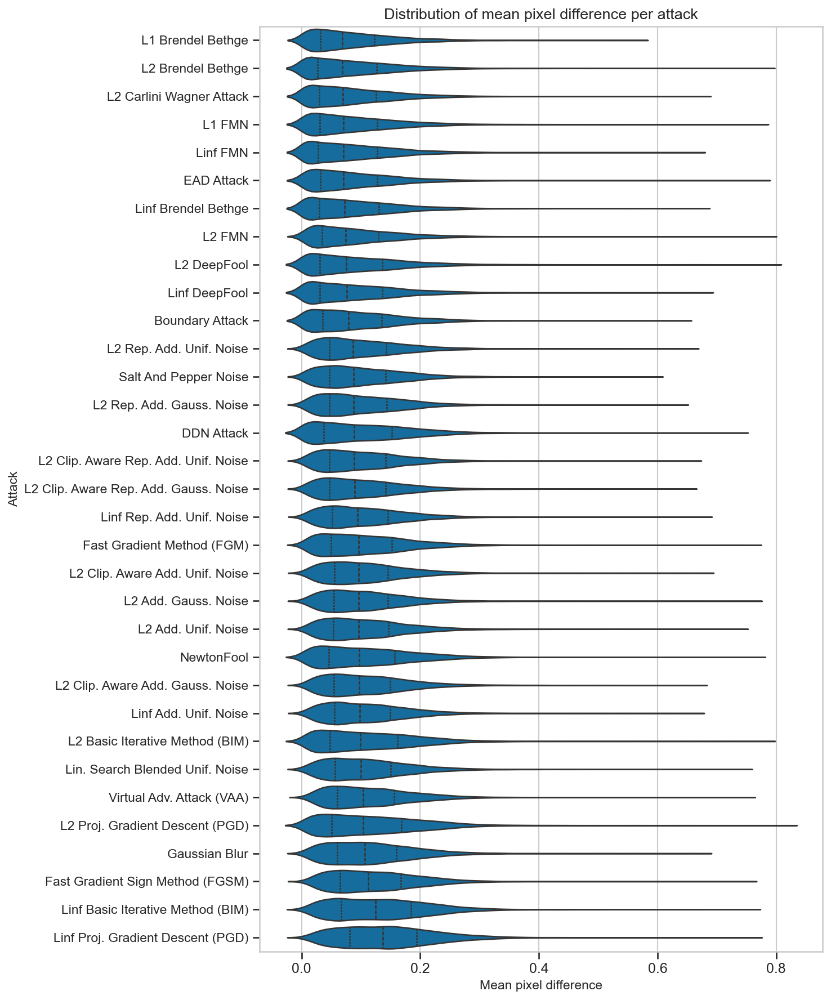

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


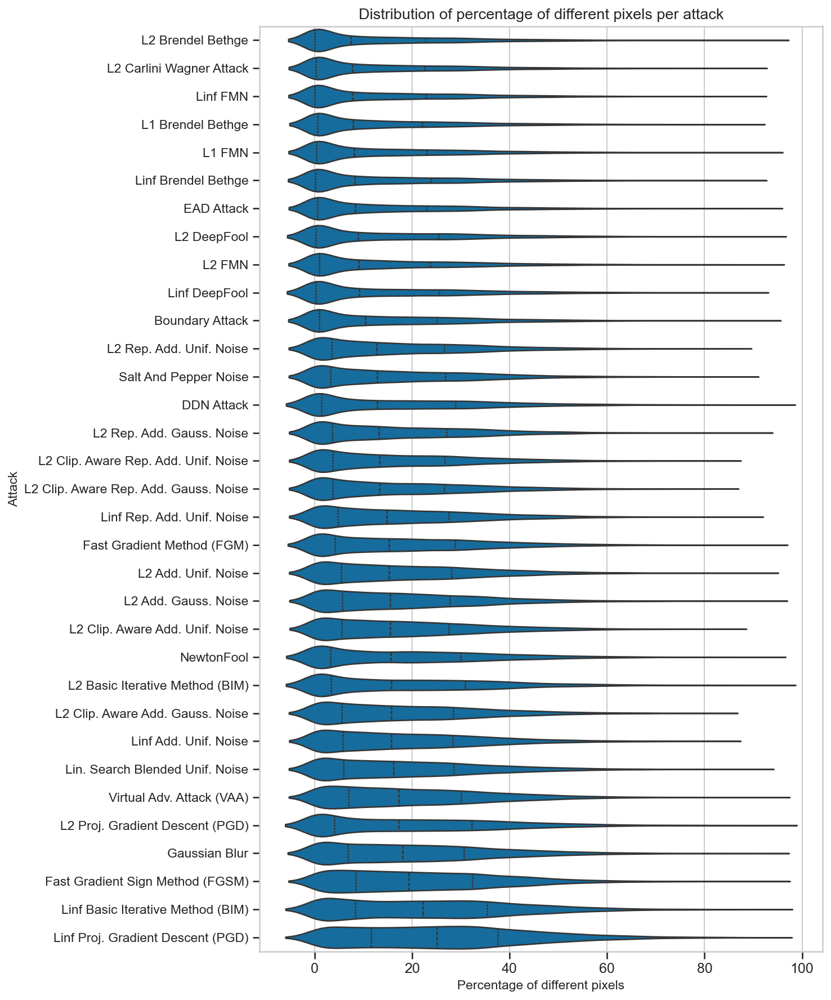

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


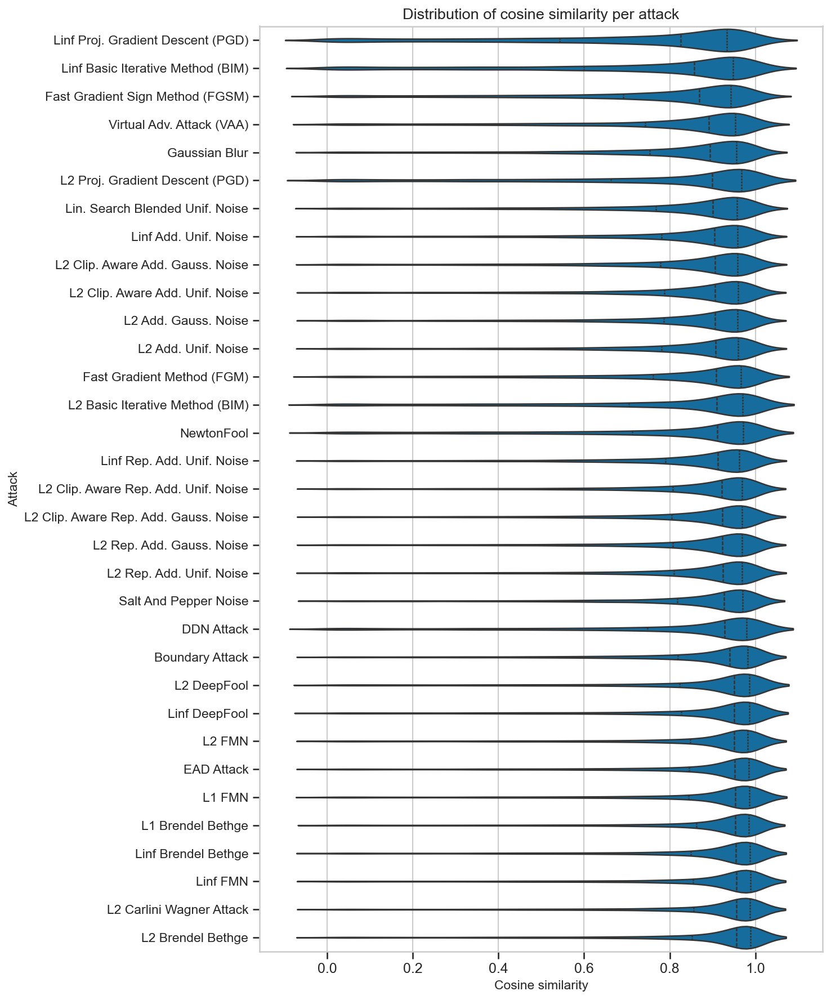

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


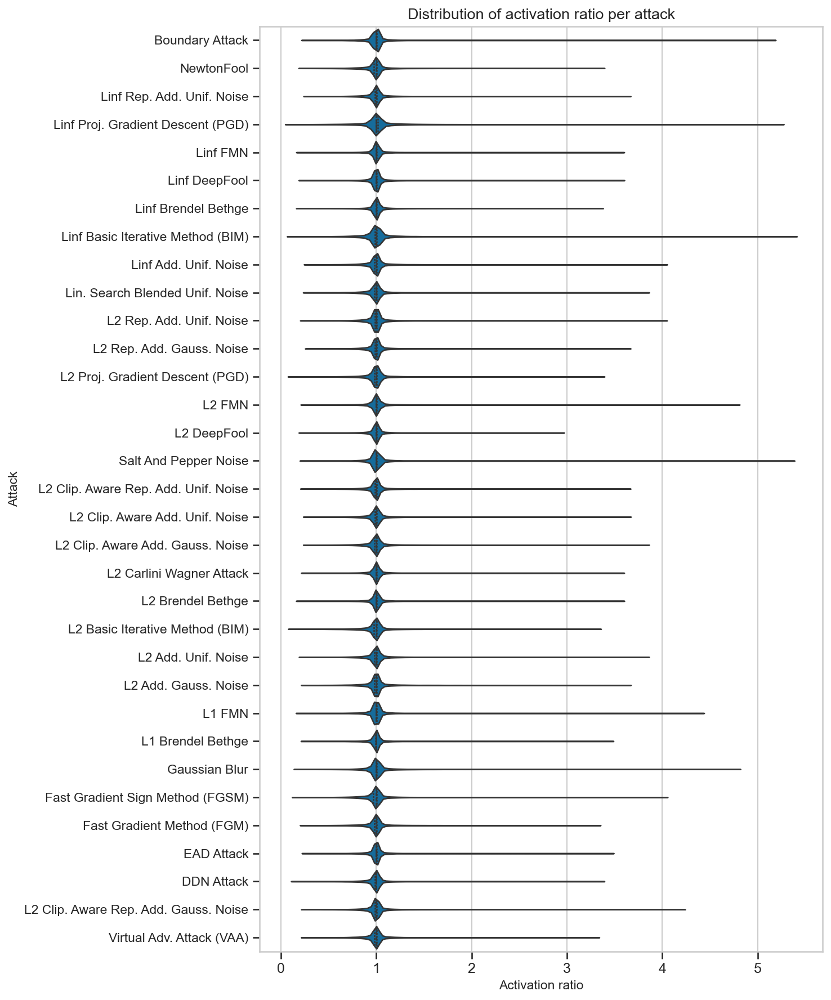

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


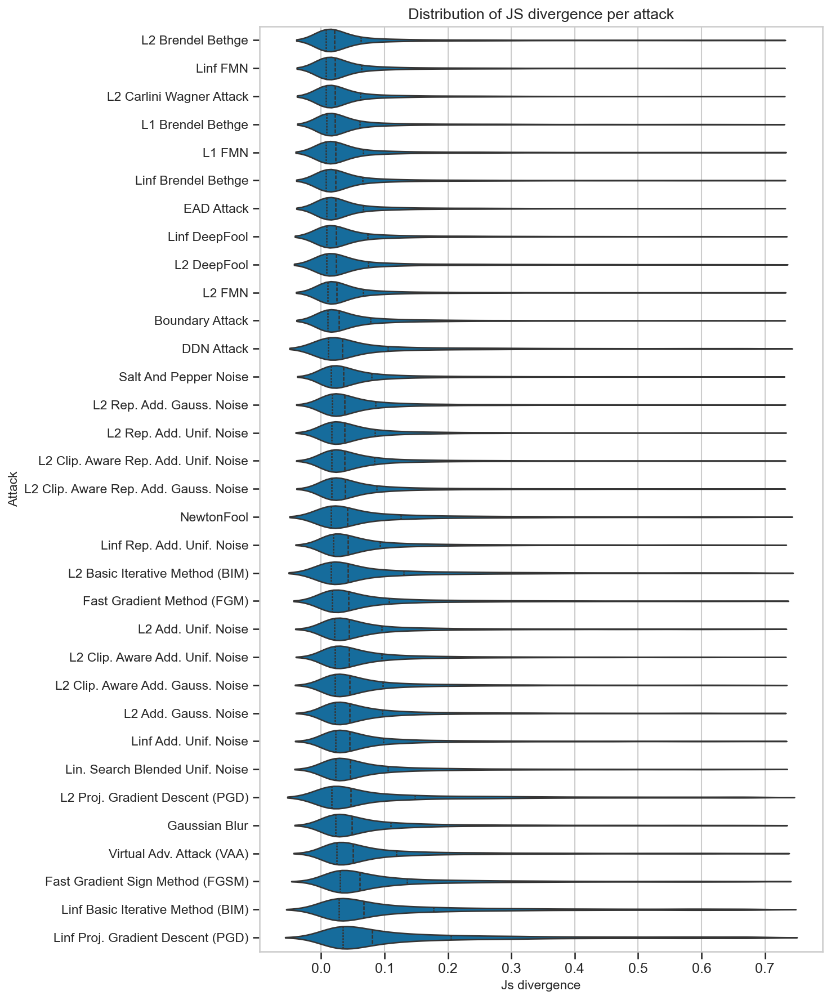

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


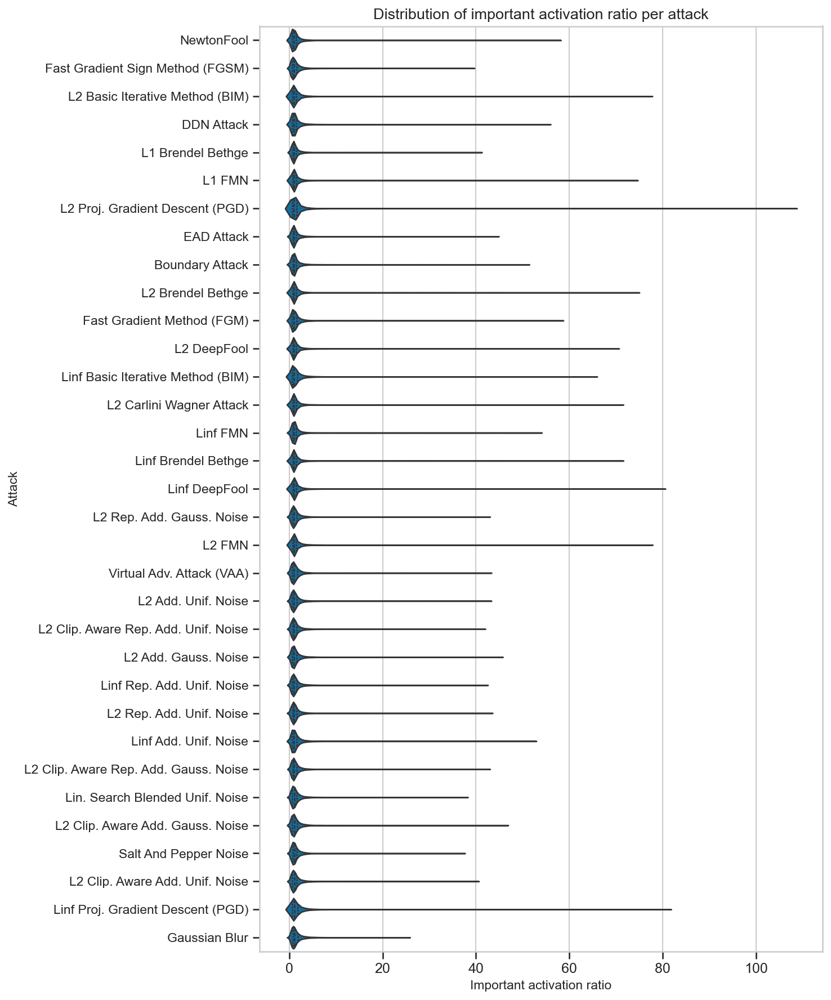

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


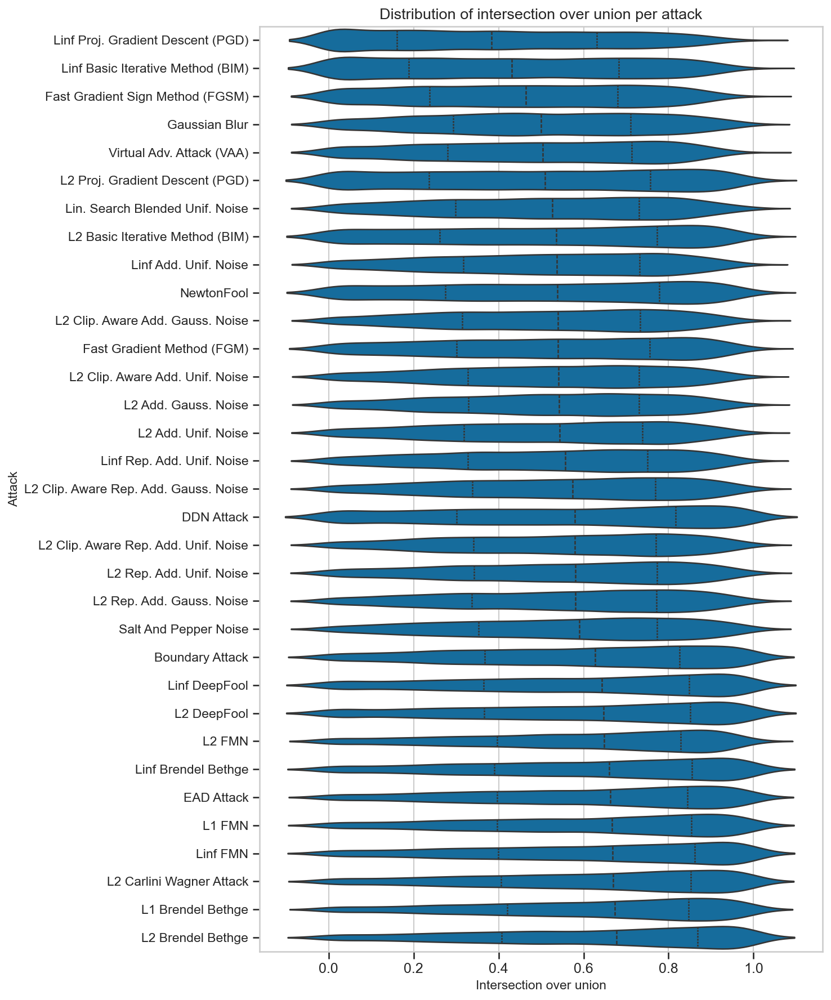

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


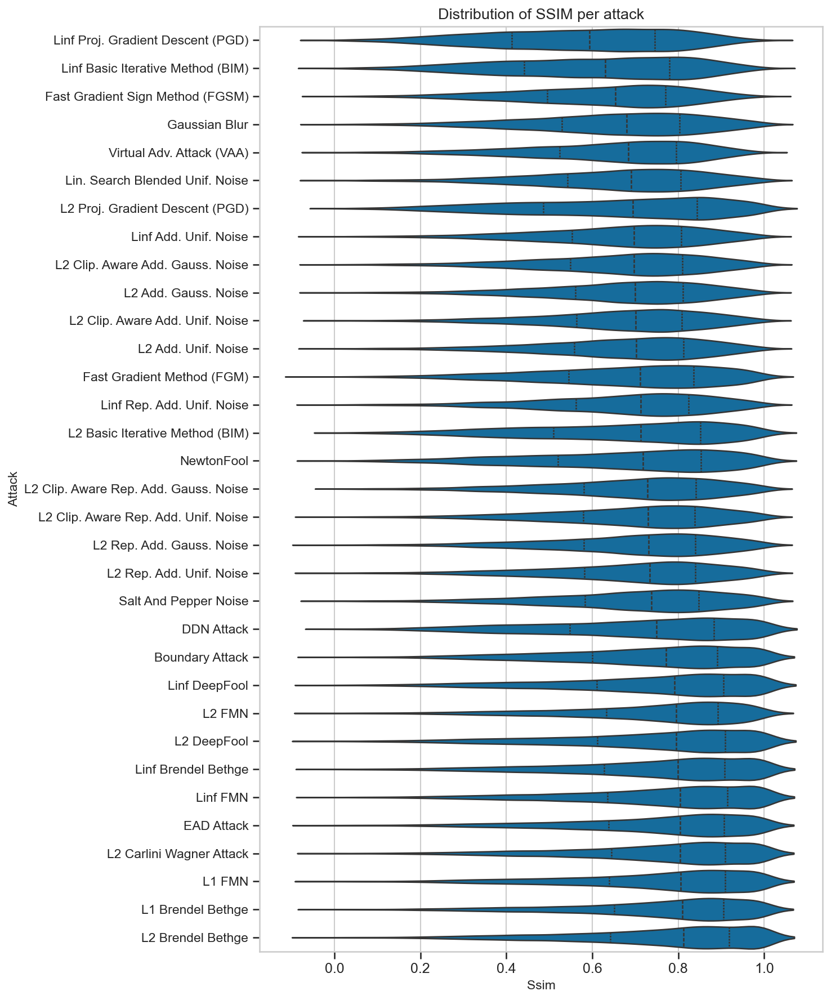

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


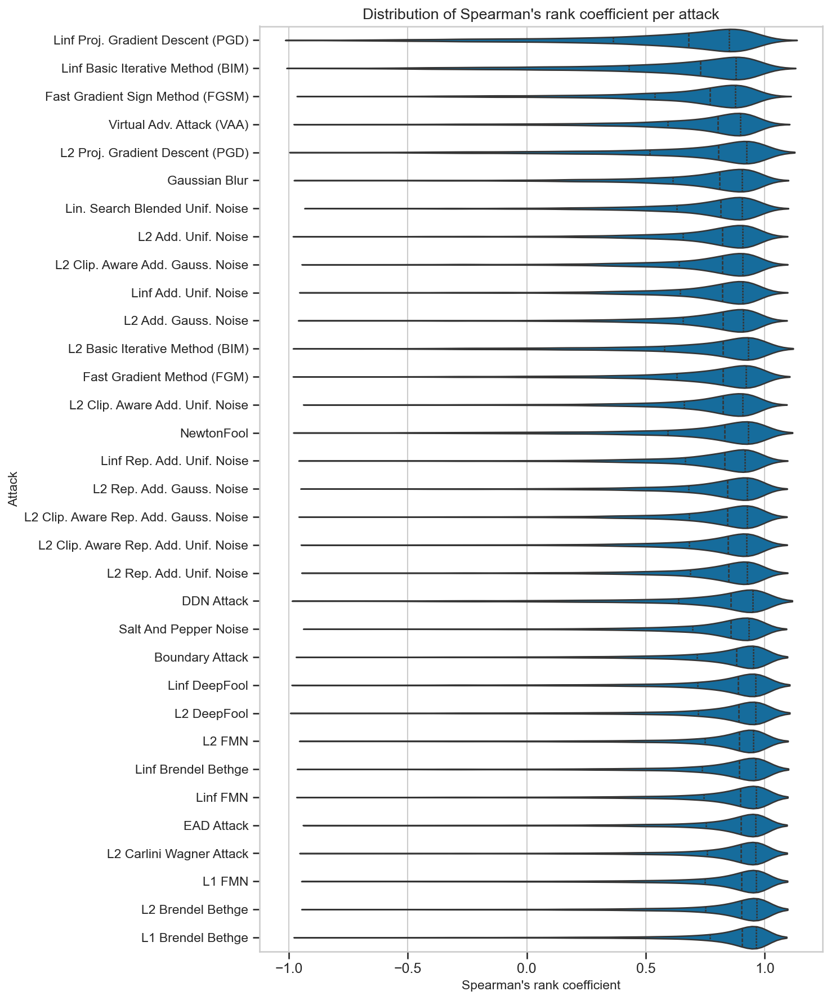

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3270272932.py:10: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


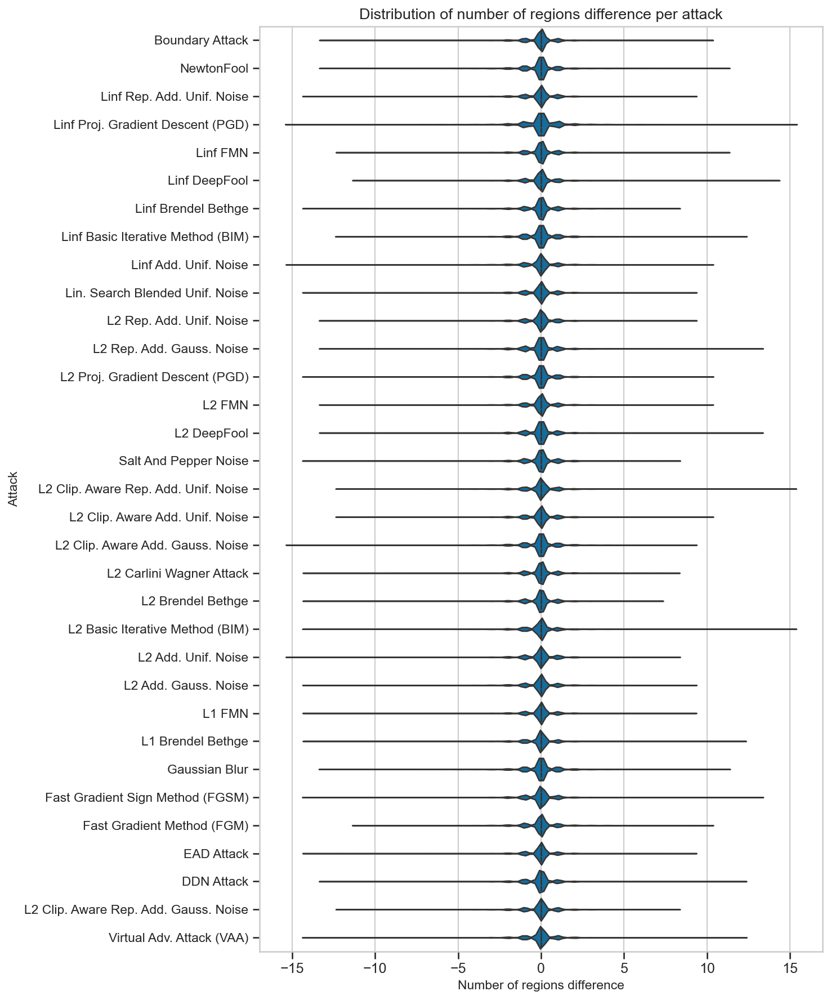

In [142]:
for metric in metric_columns:
    plot_metric_distribution_per_attack(attack_df, metric, violinplot=True)

In [17]:
results_df.groupby("attack")["SSIM"].describe().sort_values(by="attack")

,count,mean,std,min,25%,50%,75%,max
attack,,,,,,,,
Boundary Attack,21591.0,0.681551,0.201521,-0.081781,0.549208,0.709121,0.837654,1.000000
DDN Attack,21942.0,0.609404,0.245628,-0.078055,0.409629,0.633198,0.818216,0.999998
EAD Attack,19845.0,0.717519,0.211369,-0.044459,0.592513,0.768556,0.880609,1.000000
Fast Gradient Method (FGM),14931.0,0.665244,0.197778,-0.045599,0.536054,0.695158,0.818882,0.999872
Fast Gradient Sign Method (FGSM),19071.0,0.613983,0.181549,-0.015848,0.494210,0.635361,0.750396,0.996740
GaussianBlur,19899.0,0.618452,0.184467,-0.043048,0.496564,0.635776,0.752328,0.999905
L1 Brendel Bethge,20749.0,0.726380,0.202347,-0.059389,0.610892,0.774569,0.881447,1.000000
L1 FMN,21186.0,0.699850,0.224035,-0.082103,0.557180,0.755058,0.875759,1.000000
L2 Additive Gaussian Noise,9513.0,0.664669,0.180933,-0.019249,0.555089,0.689366,0.797247,0.999980


In [11]:
results_df.groupby("attack")["important activation ratio"].describe().sort_values(by="attack")

,count,mean,std,min,25%,50%,75%,max
attack,,,,,,,,
Boundary Attack,21591.0,1.353542,1.646985,0.025163,0.631200,0.996490,1.541995,75.919414
DDN Attack,21942.0,1.528600,3.579057,0.024209,0.562175,0.956350,1.485403,125.740947
EAD Attack,19845.0,1.319740,1.962741,0.017482,0.644770,0.981174,1.423382,88.345055
Fast Gradient Method (FGM),14931.0,1.403129,1.669584,0.033425,0.650248,1.003468,1.584606,58.153295
Fast Gradient Sign Method (FGSM),19071.0,1.405589,1.683980,0.025114,0.602245,0.989800,1.649863,73.505495
GaussianBlur,19899.0,1.602700,1.712767,0.039956,0.682369,1.107258,1.891335,33.850000
L1 Brendel Bethge,20749.0,1.280805,1.548886,0.016952,0.643229,0.980675,1.438258,56.864198
L1 FMN,21186.0,1.416564,3.084488,0.019707,0.626268,0.976797,1.424654,123.413919
L2 Additive Gaussian Noise,9513.0,1.376225,1.436837,0.043633,0.652190,1.028212,1.608571,45.291819


In [51]:
results_df.sort_values(by="important activation ratio", ascending=False).head(20)

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
492707,2672,EigenGradCAM,DDN Attack,volleyball,trilobite,3.840262e-06,0.311523,0.015024,0.849023,94.405692,1,1,0.463359,1.752294,0.290815,125.740947,0.480487,0.083109,0.562248,0
210670,2672,EigenGradCAM,L2 Brendel Bethge,volleyball,knee pad,3.532275e-07,0.311523,0.240205,0.813862,94.278141,1,1,0.448988,1.743119,0.294990,123.484680,0.000100,0.082739,-0.160898,0
131582,1543,EigenCAM,L1 FMN,cowboy boot,cowboy hat,3.207469e-05,0.412835,0.196367,0.639849,89.056521,1,2,0.287307,2.034091,0.410672,123.413919,0.008898,0.111463,-0.300377,1
212667,2970,EigenCAM,L2 Brendel Bethge,buckeye,manhole cover,2.777638e-07,0.381226,0.228960,0.597230,93.843670,1,1,0.740398,1.217949,0.143498,120.844633,0.803883,0.261562,0.891178,0
291760,2794,EigenGradCAM,L2 DeepFool,bagel,coffee mug,4.111569e-05,0.732429,0.040763,0.730438,88.412787,1,1,0.633598,1.222973,0.178064,120.752874,0.410599,0.202158,0.606263,0
269827,2794,EigenGradCAM,Linf DeepFool,bagel,coffee mug,7.912124e-05,0.732429,0.028600,0.727480,87.932478,1,1,0.636094,1.222973,0.176450,120.517241,0.318660,0.203426,0.590802,0
290869,2672,EigenGradCAM,L2 DeepFool,volleyball,weasel,3.071729e-06,0.311523,0.134410,0.808065,91.988202,1,1,0.476452,1.724771,0.280403,118.233983,0.293022,0.094344,0.654433,0
490902,2431,EigenCAM,DDN Attack,space bar,typewriter keyboard,8.552359e-06,0.418183,0.056357,0.652438,96.301020,1,2,0.651856,1.398551,0.193751,114.104738,0.636497,0.210650,0.799529,1
587152,2970,EigenCAM,L2 Carlini Wagner Attack,buckeye,common iguana,3.760288e-06,0.381226,0.276188,0.542980,89.915497,1,1,0.754555,1.192308,0.133320,113.031073,0.680764,0.295835,0.788355,0
499999,647,EigenGradCAM,L2 Basic Iterative Method (BIM),Brittany spaniel,African grey,4.443336e-05,0.549835,0.010224,0.844307,94.208386,1,1,0.471240,1.989583,0.295244,112.225564,0.171170,0.093866,0.174589,0


## Method-Attack Metric "distribution"

In [7]:
def plot_metric_heatmap(df, metric, cmap="coolwarm"):
    # Pivot mean and std tables
    pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
    pivot_std  = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")

    # Build annotation strings
    annotations = pivot_mean.round(2).astype(str) + " (±" + pivot_std.round(2).astype(str) + ")"

    # Plot heatmap with mean values as colours
    plt.figure(figsize=(14, 10))
    sns.heatmap(
        pivot_mean,
        cmap=cmap,
        annot=annotations,
        fmt="",  # annotations already formatted
        cbar_kws={'label': f'{metric} (mean)'}
    )
    plt.title(f"{metric}: Mean (colour) ± Std Dev (annotation)")
    plt.ylabel("Attack")
    plt.xlabel("Method")
    plt.tight_layout()
    plt.show()

In [ ]:
for metric in metric_columns:
    plot_metric_heatmap(results_df, metric)

In [147]:
def plot_metric_heatmap_with_std_dots_fixed(df, metric, cmap="coolwarm"):

    method_order = [
        "GradCAM", "AblationCAM", "ScoreCAM", "GradCAM++", "LayerCAM", 
        "EigenGradCAM", "FullGrad", "EigenCAM", "KPCA-CAM"]
    
    # Convert columns to ordered categoricals
    df["method"] = pd.Categorical(df["method"], categories=method_order, ordered=True)

    # Pivot mean and std
    pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
    pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")

    # Sort pivot_mean and get the sorted index
    pivot_mean = pivot_mean.loc[pivot_mean.mean(axis=1).sort_values(ascending=False).index]

    # Apply same sorting to pivot_std
    pivot_std = pivot_std.loc[pivot_mean.index]
    
    fig, ax = plt.subplots(figsize=(10, 10))

    # Heatmap of means with annotations
    hm = sns.heatmap(
        pivot_mean,
        cmap=cmap,
        annot=pivot_mean.round(2),  # show mean values
        fmt="",
        cbar_kws={'label': f'{metric} (mean)'},
        ax=ax
    )

    # Normalize std for dot size (font size)
    max_std = pivot_std.max().max()
    min_std = pivot_std.min().min()
    min_font, max_font = 8, 20  # Reduced range to prevent overlap

    for i, attack in enumerate(pivot_mean.index):
        for j, method in enumerate(pivot_mean.columns):
            std_val = pivot_std.loc[attack, method]
            if pd.notnull(std_val) and std_val > 0:
                # Normalize std_val between 0 and 1
                if max_std > min_std:
                    normalized_std = (std_val - min_std) / (max_std - min_std)
                else:
                    normalized_std = 0.5
                
                fontsize = min_font + normalized_std * (max_font - min_font)
                
                # Position dot in bottom-right corner to avoid overlap with text
                ax.text(
                    j + 0.13, i + 0.6, "•", 
                    ha="center", va="center",
                    fontsize=fontsize, color="black", alpha=0.8,
                    weight='bold'
                )

    # Build legend handles (example std values)
    if max_std > 0:
        example_stds = np.linspace(min_std, max_std, 3)
        legend_dots = []
        legend_labels = []
        for val in example_stds:
            if max_std > min_std:
                normalized_std = (val - min_std) / (max_std - min_std)
            else:
                normalized_std = 0.5
            fontsize = min_font + normalized_std * (max_font - min_font)
            legend_dots.append(plt.Line2D([0], [0], marker="o", color="black", 
                                        markersize=fontsize/3, linestyle="", alpha=0.8))
            legend_labels.append(f"{val:.2f}")

        # Create a separate legend axis to avoid overlap with colorbar
        # Position it below the main plot with more space
        legend_ax = fig.add_axes([0.28, 0.05, 0.6, 0.08])  # [left, bottom, width, height]
        legend_ax.axis('off')
        
        legend = legend_ax.legend(
            legend_dots, legend_labels,
            title="Std. dev. (dots)",
            loc="right",
            ncol=1,
            frameon=True,
            fancybox=True,
            shadow=True
        )
        legend.get_title().set_fontweight('bold')

    plt.sca(ax)  # Set the main ax as current
    plt.title(f"Mean and std. dev. per attack/method combination for the {metric}", pad=20)
    plt.ylabel("Attack")
    plt.xlabel("Method")
    plt.xticks(rotation=45, ha='right')
    
    # Adjust layout to make room for the legend
    plt.subplots_adjust(bottom=0.15)
    plt.savefig(f"latex/img/plots_appendix/{metric.replace(' ', '_')}_heatmap_mean_std_dots.svg", format="svg", bbox_inches='tight')
    plt.show()

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


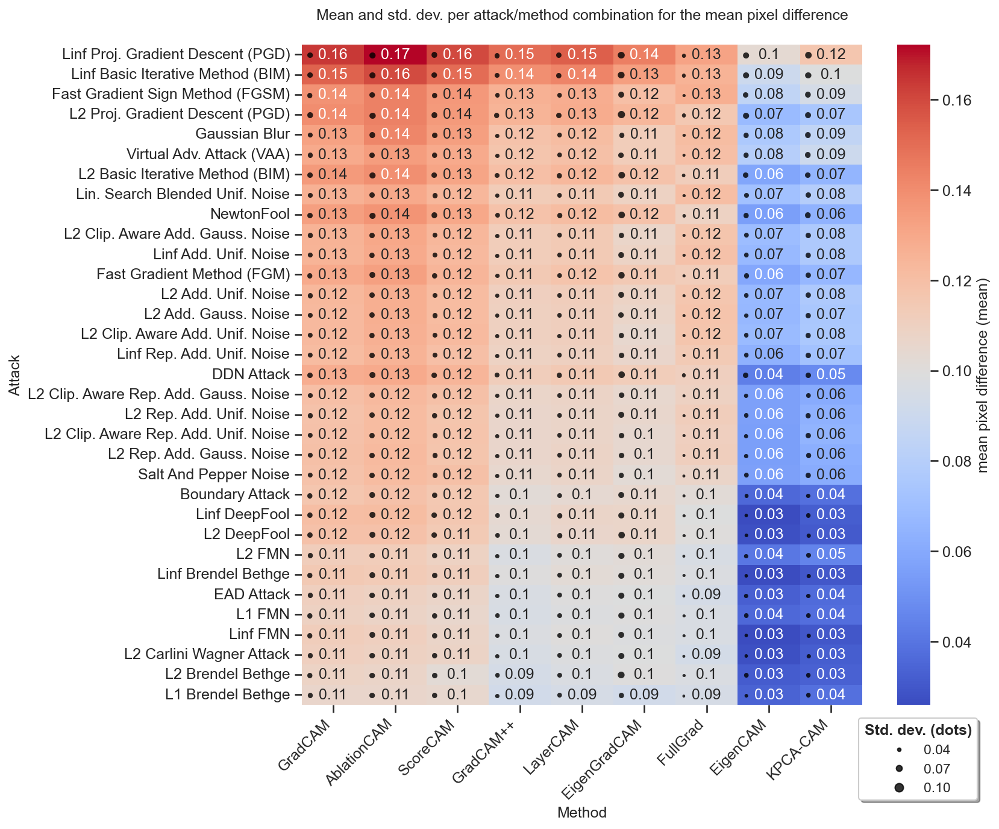

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


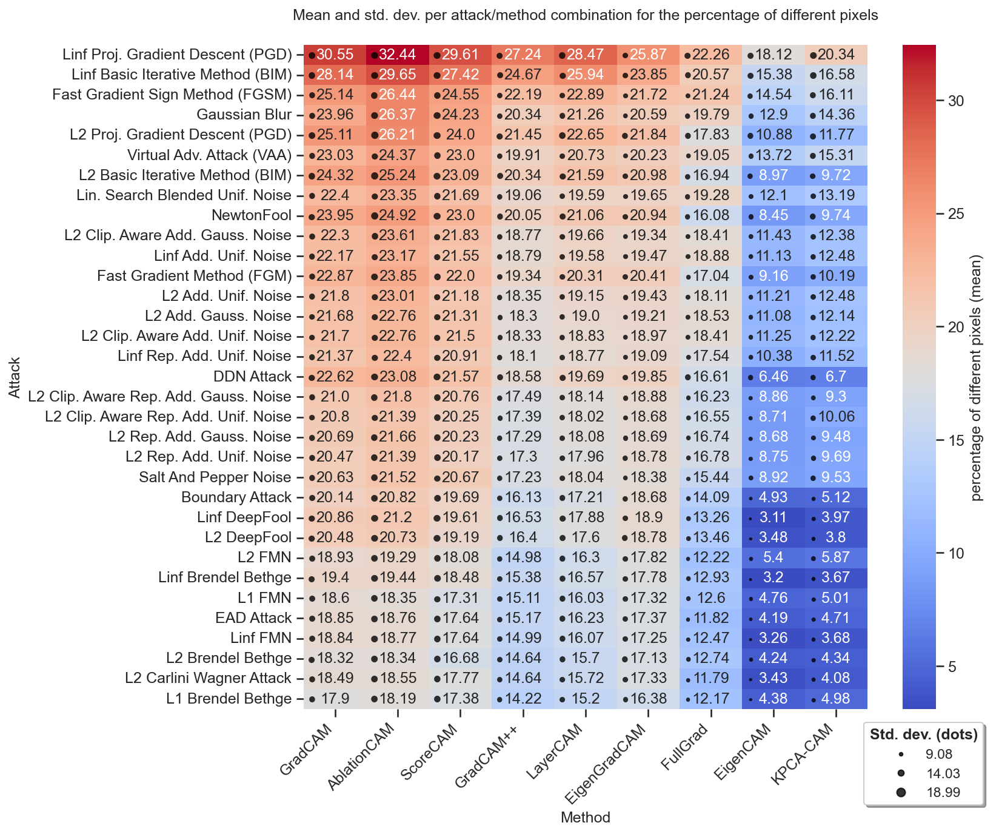

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


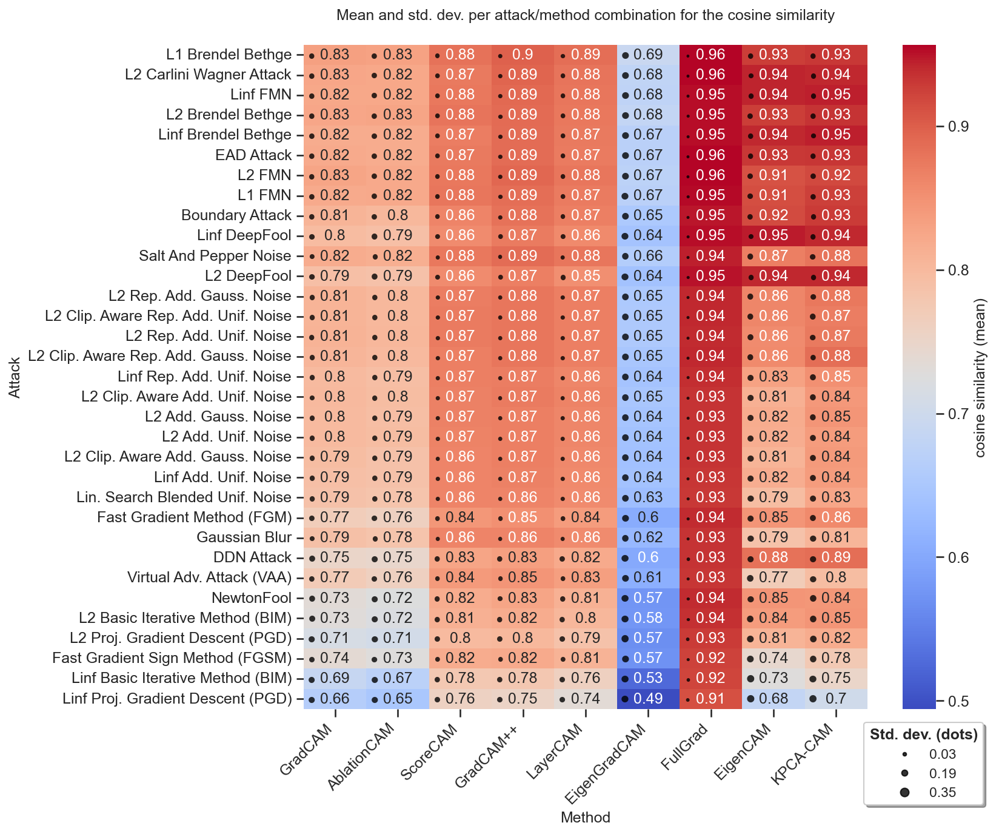

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


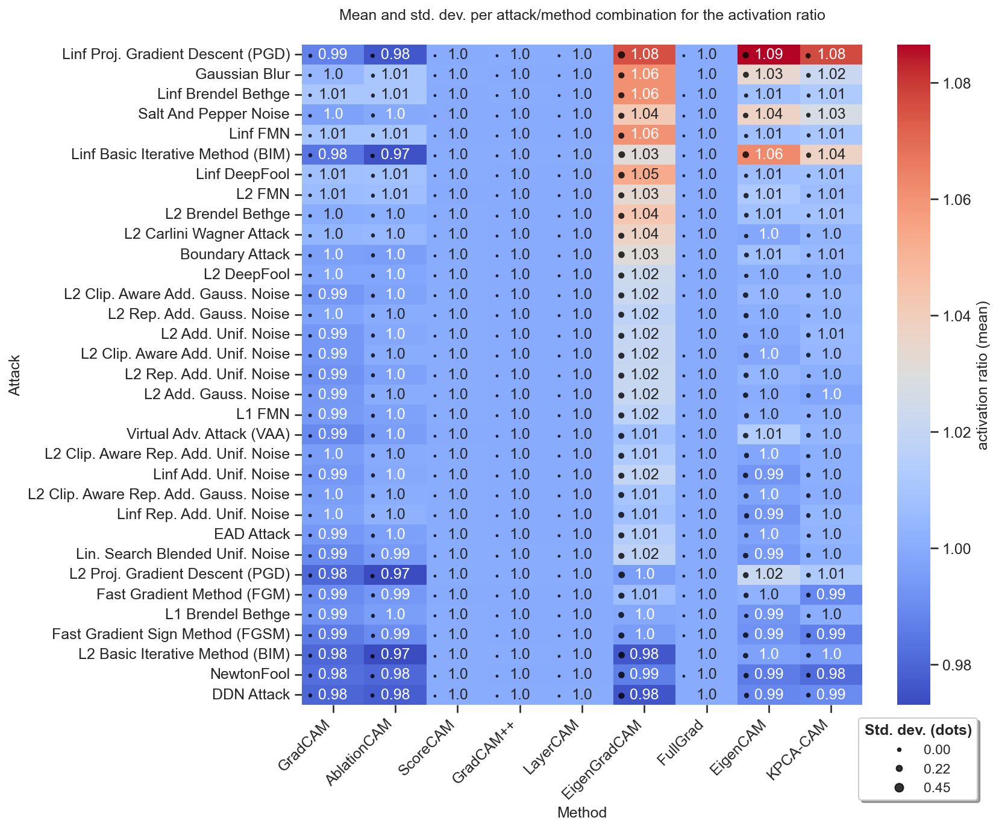

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


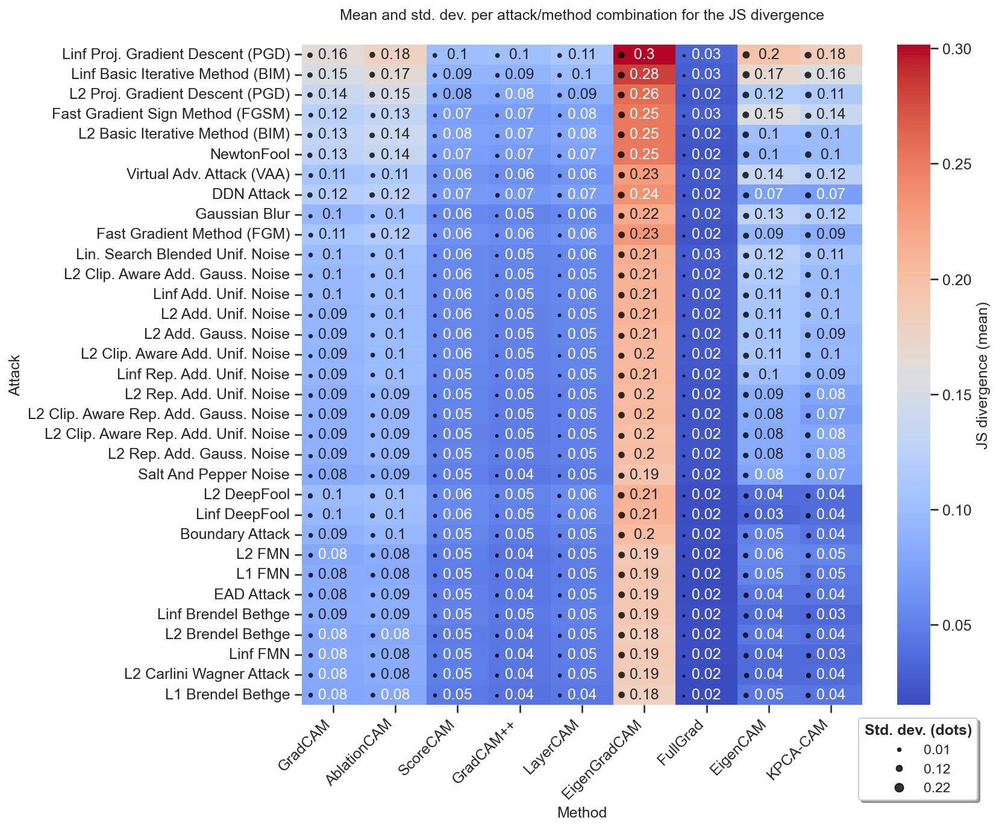

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


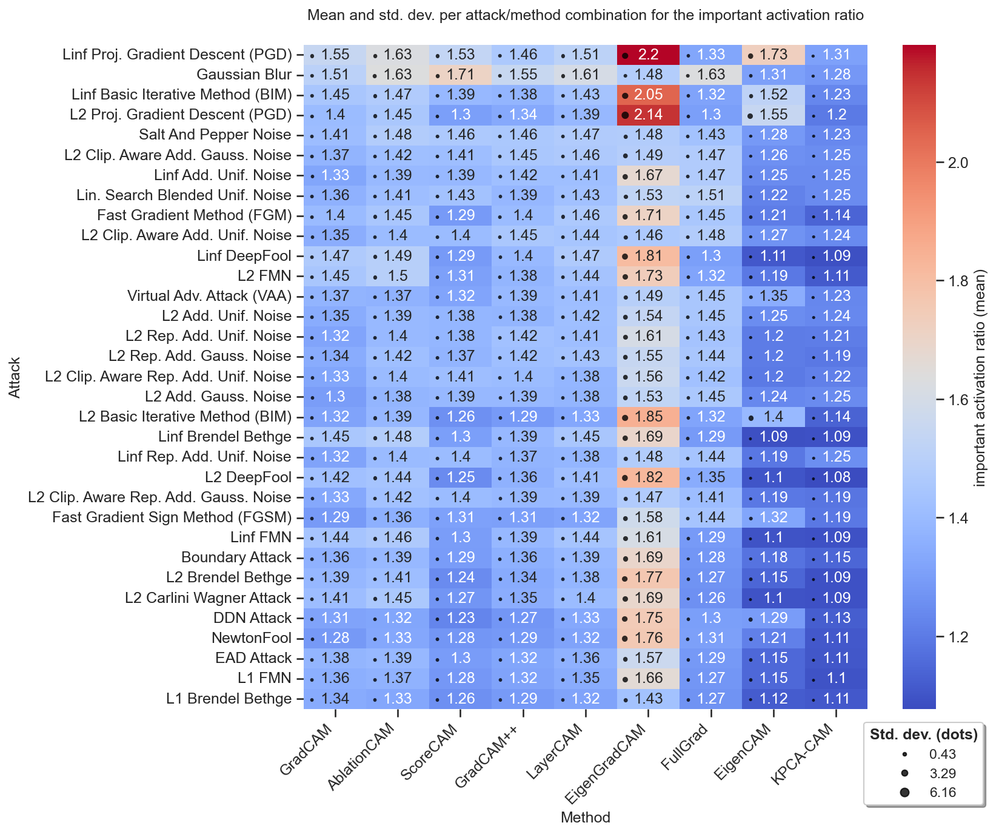

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


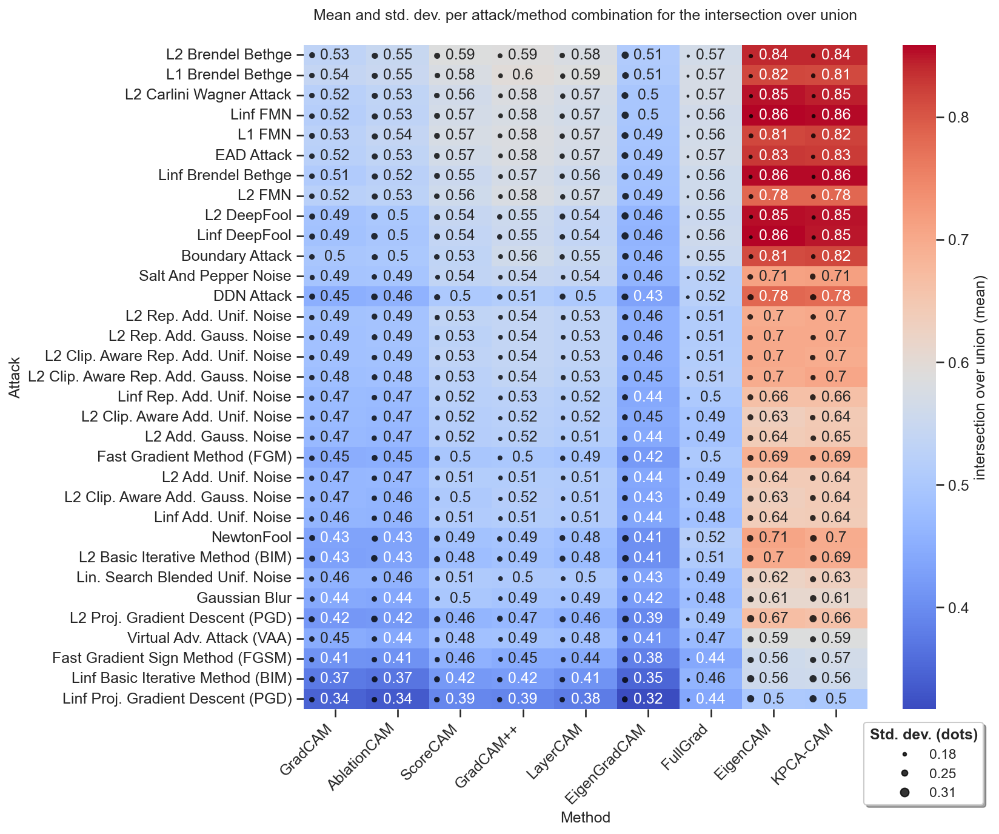

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


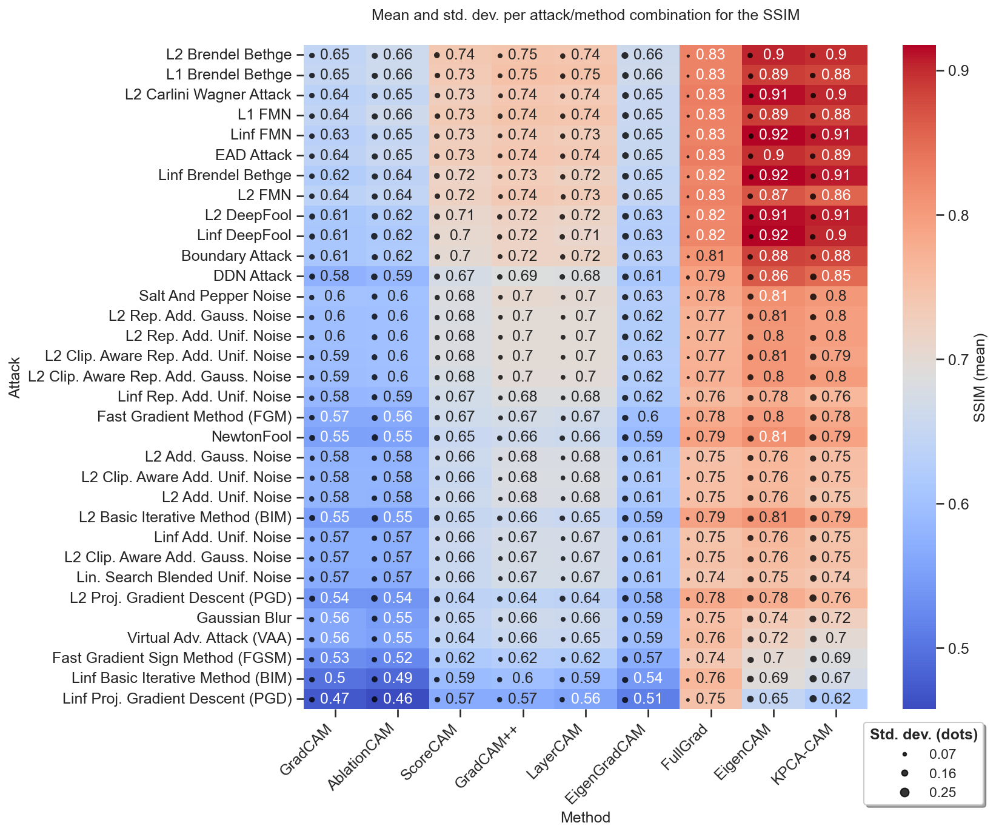

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


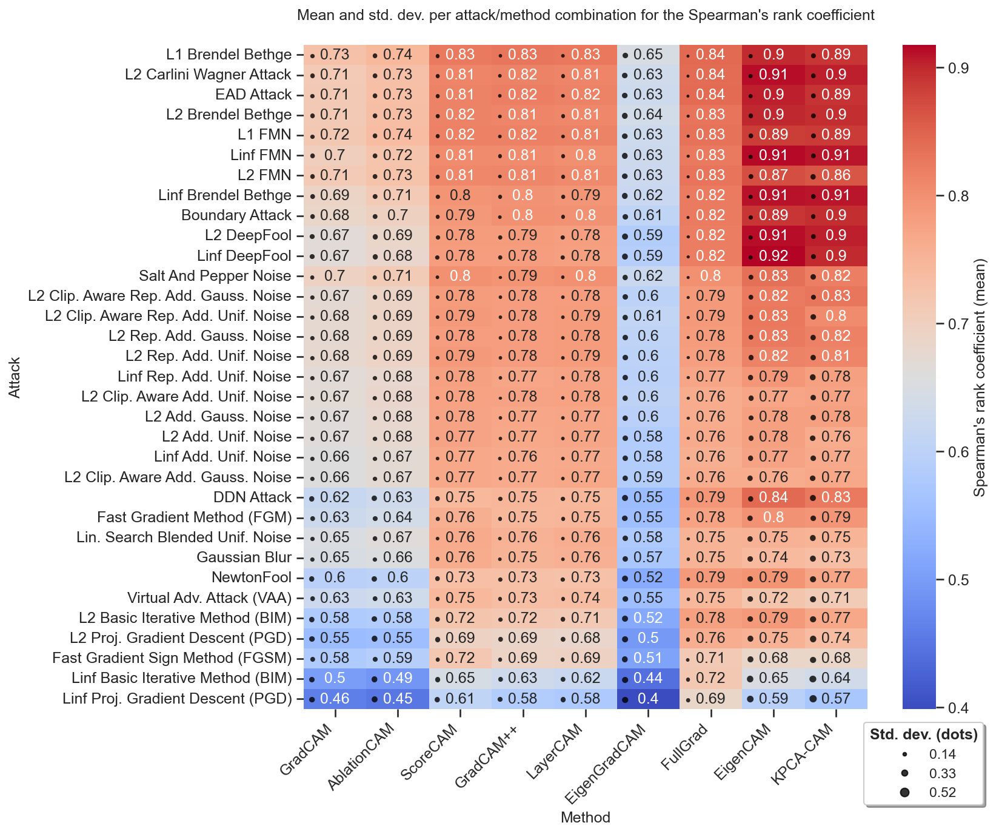

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_29329/3708845605.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


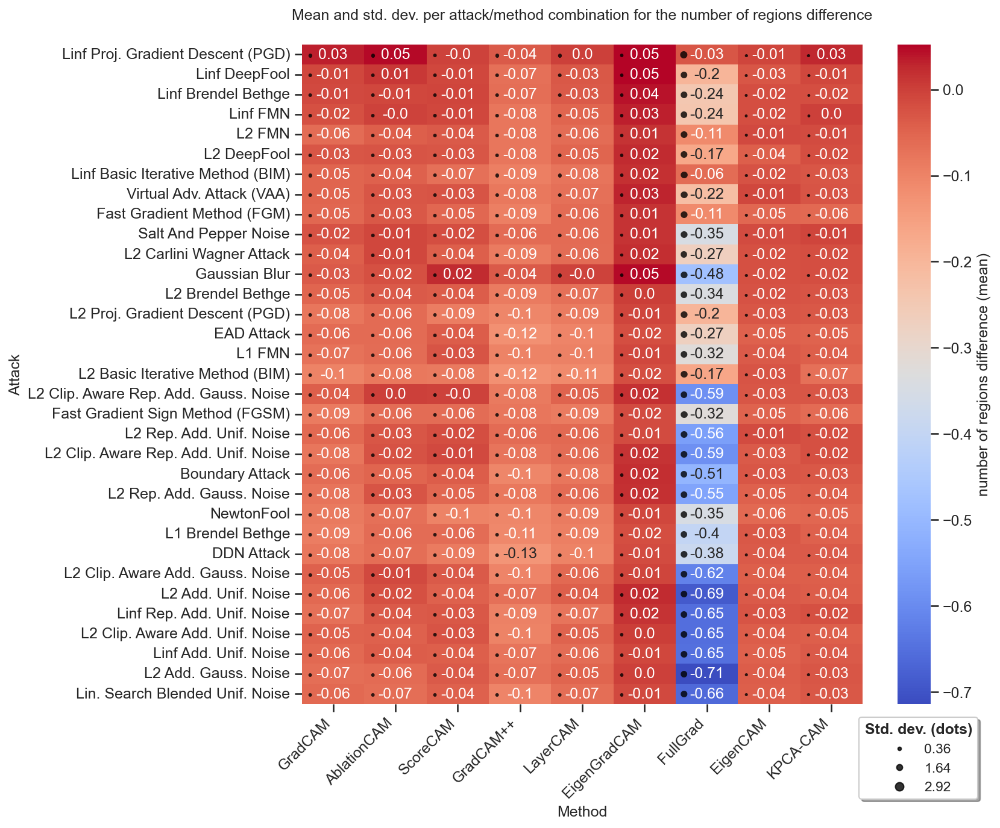

In [148]:
for metric in metric_columns:
    plot_metric_heatmap_with_std_dots_fixed(attack_df, metric)